## Open Data and Imports 

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
import descartes 
from shapely.geometry import Point, Polygon


%matplotlib inline 

In [2]:
raw_df = pd.read_csv('Seoul.csv')
df_measurements = pd.read_csv('Measurement_info.csv')
df_station = pd.read_csv('Measurement_station_info.csv')

In [3]:
def severitySO2(x):
    severity = ""
    if(x <= 0.02):
        severity = "Good"
    elif((x > 0.02) & (x <= 0.05)):
        severity = "Normal"
    elif((x > 0.05) & (x <= 0.15)):
        severity = "Bad"
    elif((x > 0.15) & (x <= 1.0)):
        severity = "Very Bad"
    return severity

def severityNO2(x):
    severity = ""
    if(x <= 0.03):
        severity = "Good"
    elif((x > 0.03) & (x <= 0.06)):
        severity = "Normal"
    elif((x > 0.06) & (x <= 0.2)):
        severity = "Bad"
    elif((x > 0.2) & (x <= 2.0)):
        severity = "Very Bad"
    return severity
    
def severityCO(x):
    severity = ""
    if(x <= 2):
        severity = "Good"
    elif((x > 2) & (x <= 9)):
        severity = "Normal"
    elif((x > 9) & (x <= 15)):
        severity = "Bad"
    elif((x > 15) & (x <= 50)):
        severity = "Very Bad"
    return severity
    
def severityO3(x):
    severity = ""
    if(x <= 0.03):
        severity = "Good"
    elif((x > 0.03) & (x <= 0.09)):
        severity = "Normal"
    elif((x > 0.09) & (x <= 0.15)):
        severity = "Bad"
    elif((x > 0.15) & (x <= 0.5)):
        severity = "Very Bad"
    return severity

def severityPM10(x):
    severity = ""
    if(x <= 30):
        severity = "Good"
    elif((x > 30) & (x <= 80)):
        severity = "Normal"
    elif((x > 80) & (x <= 150)):
        severity = "Bad"
    elif((x > 150) & (x <= 600)):
        severity = "Very Bad"
    return severity
    
def severityPM25(x):
    severity = ""
    if(x <= 15):
        severity = "Good"
    elif((x > 15) & (x <= 35)):
        severity = "Normal"
    elif((x > 35) & (x <= 75)):
        severity = "Bad"
    elif((x > 75) & (x <= 500)):
        severity = "Very Bad"
    return severity

In [4]:
raw_df['SO2 Level'] = raw_df.apply(lambda row: severitySO2(row['SO2']), axis=1)
raw_df['NO2 Level'] = raw_df.apply(lambda row: severityNO2(row['NO2']), axis=1)
raw_df['CO Level'] = raw_df.apply(lambda row: severityCO(row['CO']), axis=1)
raw_df['O3 Level'] = raw_df.apply(lambda row: severityO3(row['O3']), axis=1)
raw_df['PM10 Level'] = raw_df.apply(lambda row: severityPM10(row['PM10']), axis=1)
raw_df['PM2.5 Level'] = raw_df.apply(lambda row: severityPM25(row['PM2.5']), axis=1)

In [5]:
#raw_df['Measurement date'] = raw_df['Measurement date'].str.slice(-5)

In [6]:
raw_df['SO2 Level'].value_counts()

Good        646820
Normal         341
Bad            293
Very Bad        53
                 4
Name: SO2 Level, dtype: int64

In [7]:
#raw_df['Year'] = raw_df['Measurement date'].str.slice(0, 4)
#raw_df['Day'] = raw_df['Measurement date'].str.slice(7, 10)
#raw_df['Measurement date']= raw_df['Year'] + raw_df['Day']
#raw_df

In [8]:
raw_df['Measurement date'] = raw_df['Measurement date'].str.slice(0, 11)
df = raw_df.groupby(['Station code', 'Measurement date']).aggregate({'SO2': 'mean', 'NO2':'mean', 'O3':'mean', 'CO':'mean', 'PM10':'mean', 'PM2.5':'mean'})

In [9]:
df['SO2 Level'] = df.apply(lambda row: severitySO2(row['SO2']), axis=1)
df['NO2 Level'] = df.apply(lambda row: severityNO2(row['NO2']), axis=1)
df['CO Level'] = df.apply(lambda row: severityCO(row['CO']), axis=1)
df['O3 Level'] = df.apply(lambda row: severityO3(row['O3']), axis=1)
df['PM10 Level'] = df.apply(lambda row: severityPM10(row['PM10']), axis=1)
df['PM2.5 Level'] = df.apply(lambda row: severityPM25(row['PM2.5']), axis=1)

In [10]:
df

SO2       NO2        O3        CO  \
Station code Measurement date                                           
101          2017-01-01        0.004208  0.054250  0.003125  1.029167   
             2017-01-02        0.004792  0.046250  0.016375  1.020833   
             2017-01-03        0.004833  0.046750  0.013875  0.833333   
             2017-01-04        0.005375  0.058167  0.008750  0.991667   
             2017-01-05        0.004333  0.041333  0.011000  0.620833   
...                                 ...       ...       ...       ...   
125          2019-12-27        0.002958  0.031667  0.015708  0.562500   
             2019-12-28        0.003292  0.043417  0.005667  0.612500   
             2019-12-29        0.003125  0.036833  0.007958  0.591667   
             2019-12-30        0.002958  0.030792  0.012083  0.591667   
             2019-12-31        0.002875  0.019542  0.018542  0.416667   

                                     PM10      PM2.5 SO2 Level NO2 Level  \
Station code Measurement date                                              
101          2017-01-01         81.666667  67.291667      Good    Normal   
             2017-01-02        112.166667  87.166667      Good    Normal   
             2017-01-03         72.916667  51.833333      Good    Normal   
             2017-01-04         51.125000  34.916667      Good    Normal   
             2017-01-05         34.875000  21.958333      Good    Normal   
...                                   ...        ...       ...       ...   
125          2019-12-27         41.083333  30.125000      Good    Normal   
             2019-12-28         49.375000  31.291667      Good    Normal   
             2019-12-29         49.791667  33.666667      Good    Normal   
             2019-12-30         46.125000  35.250000      Good    Normal   
             2019-12-31         27.458333  19.291667      Good      Good   

                              CO Level O3 Level PM10 Level PM2.5 Level  
Station code Measurement date                                           
101          2017-01-01           Good     Good        Bad         Bad  
             2017-01-02           Good     Good        Bad    Very Bad  
             2017-01-03           Good     Good     Normal         Bad  
             2017-01-04           Good     Good     Normal      Normal  
             2017-01-05           Good     Good     Normal      Normal  
...                                ...      ...        ...         ...  
125          2019-12-27           Good     Good     Normal      Normal  
             2019-12-28           Good     Good     Normal      Normal  
             2019-12-29           Good     Good     Normal      Normal  
             2019-12-30           Good     Good     Normal         Bad  
             2019-12-31           Good     Good       Good      Normal  

[27125 rows x 12 columns]

lets make reset the index of the mesurment date

In [11]:
#df['Measurement date'] = df['Measurement date'].str.slice(-10)
#df['Measurement date'] = pd.to_datetime(df['Measurement date'])
#df.set_index(df['Measurement date'], inplace=True)
#df.drop('Measurement date', axis=1, inplace=True)

In [12]:
df

SO2       NO2        O3        CO  \
Station code Measurement date                                           
101          2017-01-01        0.004208  0.054250  0.003125  1.029167   
             2017-01-02        0.004792  0.046250  0.016375  1.020833   
             2017-01-03        0.004833  0.046750  0.013875  0.833333   
             2017-01-04        0.005375  0.058167  0.008750  0.991667   
             2017-01-05        0.004333  0.041333  0.011000  0.620833   
...                                 ...       ...       ...       ...   
125          2019-12-27        0.002958  0.031667  0.015708  0.562500   
             2019-12-28        0.003292  0.043417  0.005667  0.612500   
             2019-12-29        0.003125  0.036833  0.007958  0.591667   
             2019-12-30        0.002958  0.030792  0.012083  0.591667   
             2019-12-31        0.002875  0.019542  0.018542  0.416667   

                                     PM10      PM2.5 SO2 Level NO2 Level  \
Station code Measurement date                                              
101          2017-01-01         81.666667  67.291667      Good    Normal   
             2017-01-02        112.166667  87.166667      Good    Normal   
             2017-01-03         72.916667  51.833333      Good    Normal   
             2017-01-04         51.125000  34.916667      Good    Normal   
             2017-01-05         34.875000  21.958333      Good    Normal   
...                                   ...        ...       ...       ...   
125          2019-12-27         41.083333  30.125000      Good    Normal   
             2019-12-28         49.375000  31.291667      Good    Normal   
             2019-12-29         49.791667  33.666667      Good    Normal   
             2019-12-30         46.125000  35.250000      Good    Normal   
             2019-12-31         27.458333  19.291667      Good      Good   

                              CO Level O3 Level PM10 Level PM2.5 Level  
Station code Measurement date                                           
101          2017-01-01           Good     Good        Bad         Bad  
             2017-01-02           Good     Good        Bad    Very Bad  
             2017-01-03           Good     Good     Normal         Bad  
             2017-01-04           Good     Good     Normal      Normal  
             2017-01-05           Good     Good     Normal      Normal  
...                                ...      ...        ...         ...  
125          2019-12-27           Good     Good     Normal      Normal  
             2019-12-28           Good     Good     Normal      Normal  
             2019-12-29           Good     Good     Normal      Normal  
             2019-12-30           Good     Good     Normal         Bad  
             2019-12-31           Good     Good       Good      Normal  

[27125 rows x 12 columns]

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 27125 entries, (101, '2017-01-01 ') to (125, '2019-12-31 ')
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   SO2          27125 non-null  float64
 1   NO2          27125 non-null  float64
 2   O3           27125 non-null  float64
 3   CO           27125 non-null  float64
 4   PM10         27125 non-null  float64
 5   PM2.5        27125 non-null  float64
 6   SO2 Level    27125 non-null  object 
 7   NO2 Level    27125 non-null  object 
 8   CO Level     27125 non-null  object 
 9   O3 Level     27125 non-null  object 
 10  PM10 Level   27125 non-null  object 
 11  PM2.5 Level  27125 non-null  object 
dtypes: float64(6), object(6)
memory usage: 2.6+ MB


Create some new columns for date and month

In [14]:
df = df.reset_index()

This is a general indiction of what levels of certain pollutants are the worse.

In [15]:
df_measurements

,Item code,Item name,Unit of measurement,Good(Blue),Normal(Green),Bad(Yellow),Very bad(Red)
0,1,SO2,ppm,0.02,0.05,0.15,1.0
1,3,NO2,ppm,0.03,0.06,0.20,2.0
2,5,CO,ppm,2.00,9.00,15.00,50.0
3,6,O3,ppm,0.03,0.09,0.15,0.5
4,8,PM10,Mircrogram/m3,30.00,80.00,150.00,600.0
5,9,PM2.5,Mircrogram/m3,15.00,35.00,75.00,500.0


Station based on district of Seoul

In [16]:
df_station

,Station code,Station name(district),Address,Latitude,Longitude
0,101,Jongno-gu,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008
1,102,Jung-gu,"15, Deoksugung-gil, Jung-gu, Seoul, Republic o...",37.564263,126.974676
2,103,Yongsan-gu,"136, Hannam-daero, Yongsan-gu, Seoul, Republic...",37.540033,127.004850
3,104,Eunpyeong-gu,"215, Jinheung-ro, Eunpyeong-gu, Seoul, Republi...",37.609823,126.934848
4,105,Seodaemun-gu,"32, Segeomjeong-ro 4-gil, Seodaemun-gu, Seoul,...",37.593742,126.949679
5,106,Mapo-gu,"10, Poeun-ro 6-gil, Mapo-gu, Seoul, Republic o...",37.555580,126.905597
6,107,Seongdong-gu,"18, Ttukseom-ro 3-gil, Seongdong-gu, Seoul, Re...",37.541864,127.049659
7,108,Gwangjin-gu,"571, Gwangnaru-ro, Gwangjin-gu, Seoul, Republi...",37.547180,127.092493
8,109,Dongdaemun-gu,"43, Cheonho-daero 13-gil, Dongdaemun-gu, Seoul...",37.575743,127.028885
9,110,Jungnang-gu,"369, Yongmasan-ro, Jungnang-gu, Seoul, Republi...",37.584848,127.094023


# Some EDA 

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27125 entries, 0 to 27124
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Station code      27125 non-null  int64  
 1   Measurement date  27125 non-null  object 
 2   SO2               27125 non-null  float64
 3   NO2               27125 non-null  float64
 4   O3                27125 non-null  float64
 5   CO                27125 non-null  float64
 6   PM10              27125 non-null  float64
 7   PM2.5             27125 non-null  float64
 8   SO2 Level         27125 non-null  object 
 9   NO2 Level         27125 non-null  object 
 10  CO Level          27125 non-null  object 
 11  O3 Level          27125 non-null  object 
 12  PM10 Level        27125 non-null  object 
 13  PM2.5 Level       27125 non-null  object 
dtypes: float64(6), int64(1), object(7)
memory usage: 2.9+ MB


In [18]:
df['SO2'].value_counts().head()

0.003000    657
0.004000    527
0.002000    358
0.005000    285
0.003042    284
Name: SO2, dtype: int64

In [19]:
df['NO2'].value_counts()

-1.000000    121
 0.000000     78
 0.020375     41
 0.018458     37
 0.018917     37
            ... 
 0.047958      1
-0.102583      1
 0.019571      1
 0.061083      1
 0.015792      1
Name: NO2, Length: 5358, dtype: int64

In [20]:
df['O3'].value_counts()

-1.000000    121
 0.000000     69
 0.031500     36
 0.015542     31
 0.014250     30
            ... 
 0.034739      1
 0.054083      1
 0.055375      1
 0.027348      1
 0.022083      1
Name: O3, Length: 5634, dtype: int64

In [21]:
df['CO'].value_counts()

 0.333333    155
 0.529167    134
 0.425000    124
-1.000000    124
 0.537500    121
            ... 
 0.843750      1
 1.200000      1
 0.346154      1
-0.104167      1
 0.125000      1
Name: CO, Length: 1983, dtype: int64

In [22]:
df['PM10'].value_counts()

 0.000000      134
-1.000000      119
 27.000000      35
 32.541667      35
 26.000000      33
              ... 
 184.375000      1
 51.214286       1
 129.750000      1
 42.466667       1
 215.583333      1
Name: PM10, Length: 3473, dtype: int64

In [23]:
df['PM2.5'].value_counts()

 0.000000      133
-1.000000      119
 19.083333      58
 15.875000      50
 21.333333      49
              ... 
 149.625000      1
 101.833333      1
 25.652174       1
 89.000000       1
 16.761905       1
Name: PM2.5, Length: 2668, dtype: int64

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27125 entries, 0 to 27124
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Station code      27125 non-null  int64  
 1   Measurement date  27125 non-null  object 
 2   SO2               27125 non-null  float64
 3   NO2               27125 non-null  float64
 4   O3                27125 non-null  float64
 5   CO                27125 non-null  float64
 6   PM10              27125 non-null  float64
 7   PM2.5             27125 non-null  float64
 8   SO2 Level         27125 non-null  object 
 9   NO2 Level         27125 non-null  object 
 10  CO Level          27125 non-null  object 
 11  O3 Level          27125 non-null  object 
 12  PM10 Level        27125 non-null  object 
 13  PM2.5 Level       27125 non-null  object 
dtypes: float64(6), int64(1), object(7)
memory usage: 2.9+ MB


Looking to see any correlations between any pollutants 

Lets make a polutant df

In [25]:
df.corr().style.background_gradient(cmap='coolwarm')

,Station code,SO2,NO2,O3,CO,PM10,PM2.5
Station code,1.000000,0.029376,0.031232,0.024183,-0.054899,0.042596,0.035621
SO2,0.029376,1.000000,0.915449,0.934451,0.416637,0.064411,0.090977
NO2,0.031232,0.915449,1.000000,0.936623,0.467155,0.099394,0.149780
O3,0.024183,0.934451,0.936623,1.000000,0.343521,0.059576,0.076826
CO,-0.054899,0.416637,0.467155,0.343521,1.000000,0.245039,0.407023
PM10,0.042596,0.064411,0.099394,0.059576,0.245039,1.000000,0.360625
PM2.5,0.035621,0.090977,0.149780,0.076826,0.407023,0.360625,1.000000


Looking at Stations and different 

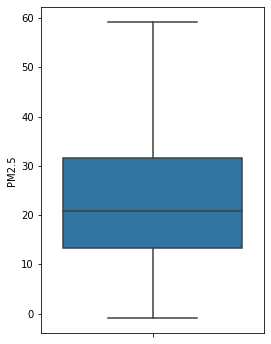

In [26]:
#Pm2.5 Levels by Stations
fig, axes = plt.subplots(1, 1, figsize=(4, 6))
sns.boxplot(y='PM2.5', data=df, showfliers=False);

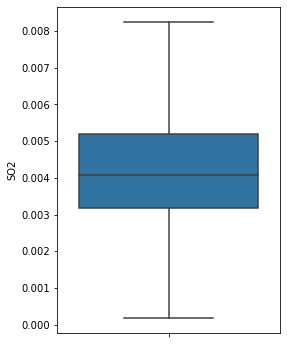

In [27]:
#SO2 Levels by Stations
fig, axes = plt.subplots(1, 1, figsize=(4, 6))
sns.boxplot(y='SO2', data=df, showfliers=False);

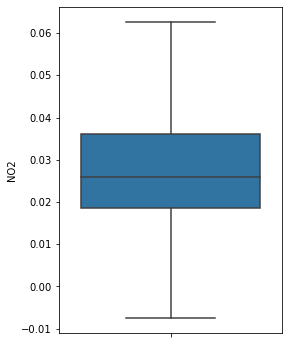

In [28]:
#NO2 Levels by Stations
fig, axes = plt.subplots(1, 1, figsize=(4, 6))
sns.boxplot(y='NO2', data=df, showfliers=False);

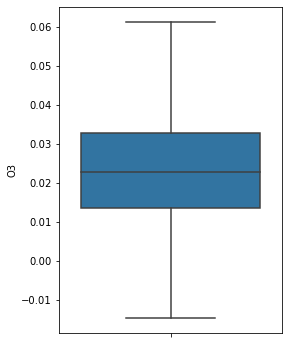

In [29]:
#O3 Levels by Stations
fig, axes = plt.subplots(1, 1, figsize=(4, 6))
sns.boxplot(y='O3', data=df, showfliers=False);

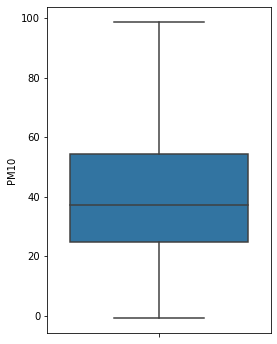

In [30]:
#PM10 Levels by Stations
fig, axes = plt.subplots(1, 1, figsize=(4, 6))
sns.boxplot(y='PM10', data=df, showfliers=False);

In [31]:
df

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
0,101,2017-01-01,0.004208,0.054250,0.003125,1.029167,81.666667,67.291667,Good,Normal,Good,Good,Bad,Bad
1,101,2017-01-02,0.004792,0.046250,0.016375,1.020833,112.166667,87.166667,Good,Normal,Good,Good,Bad,Very Bad
2,101,2017-01-03,0.004833,0.046750,0.013875,0.833333,72.916667,51.833333,Good,Normal,Good,Good,Normal,Bad
3,101,2017-01-04,0.005375,0.058167,0.008750,0.991667,51.125000,34.916667,Good,Normal,Good,Good,Normal,Normal
4,101,2017-01-05,0.004333,0.041333,0.011000,0.620833,34.875000,21.958333,Good,Normal,Good,Good,Normal,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27120,125,2019-12-27,0.002958,0.031667,0.015708,0.562500,41.083333,30.125000,Good,Normal,Good,Good,Normal,Normal
27121,125,2019-12-28,0.003292,0.043417,0.005667,0.612500,49.375000,31.291667,Good,Normal,Good,Good,Normal,Normal
27122,125,2019-12-29,0.003125,0.036833,0.007958,0.591667,49.791667,33.666667,Good,Normal,Good,Good,Normal,Normal
27123,125,2019-12-30,0.002958,0.030792,0.012083,0.591667,46.125000,35.250000,Good,Normal,Good,Good,Normal,Bad


In [32]:
df_station

,Station code,Station name(district),Address,Latitude,Longitude
0,101,Jongno-gu,"19, Jong-ro 35ga-gil, Jongno-gu, Seoul, Republ...",37.572016,127.005008
1,102,Jung-gu,"15, Deoksugung-gil, Jung-gu, Seoul, Republic o...",37.564263,126.974676
2,103,Yongsan-gu,"136, Hannam-daero, Yongsan-gu, Seoul, Republic...",37.540033,127.004850
3,104,Eunpyeong-gu,"215, Jinheung-ro, Eunpyeong-gu, Seoul, Republi...",37.609823,126.934848
4,105,Seodaemun-gu,"32, Segeomjeong-ro 4-gil, Seodaemun-gu, Seoul,...",37.593742,126.949679
5,106,Mapo-gu,"10, Poeun-ro 6-gil, Mapo-gu, Seoul, Republic o...",37.555580,126.905597
6,107,Seongdong-gu,"18, Ttukseom-ro 3-gil, Seongdong-gu, Seoul, Re...",37.541864,127.049659
7,108,Gwangjin-gu,"571, Gwangnaru-ro, Gwangjin-gu, Seoul, Republi...",37.547180,127.092493
8,109,Dongdaemun-gu,"43, Cheonho-daero 13-gil, Dongdaemun-gu, Seoul...",37.575743,127.028885
9,110,Jungnang-gu,"369, Yongmasan-ro, Jungnang-gu, Seoul, Republi...",37.584848,127.094023


Testing every station and see what pollutants are relavent to each station before modeling and testing. I will sperate every year and see if it shows the variation

In [33]:
features = ['SO2', 'NO2', 'O3', 'CO', 'PM10', 'PM2.5']

# Station 101

In [34]:
df_101 = df[df['Station code'] == 101]

In [111]:
df_101

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
0,101,2017-01-01,0.004208,0.054250,0.003125,1.029167,81.666667,67.291667,Good,Normal,Good,Good,Bad,Bad
1,101,2017-01-02,0.004792,0.046250,0.016375,1.020833,112.166667,87.166667,Good,Normal,Good,Good,Bad,Very Bad
2,101,2017-01-03,0.004833,0.046750,0.013875,0.833333,72.916667,51.833333,Good,Normal,Good,Good,Normal,Bad
3,101,2017-01-04,0.005375,0.058167,0.008750,0.991667,51.125000,34.916667,Good,Normal,Good,Good,Normal,Normal
4,101,2017-01-05,0.004333,0.041333,0.011000,0.620833,34.875000,21.958333,Good,Normal,Good,Good,Normal,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1080,101,2019-12-27,0.006042,0.025083,0.018375,0.837500,34.416667,24.958333,Good,Good,Good,Good,Normal,Normal
1081,101,2019-12-28,0.004250,0.046542,0.004708,0.766667,44.500000,30.458333,Good,Normal,Good,Good,Normal,Normal
1082,101,2019-12-29,0.003792,0.037750,0.008167,0.708333,45.375000,30.291667,Good,Normal,Good,Good,Normal,Normal
1083,101,2019-12-30,0.003375,0.033042,0.010333,0.683333,38.791667,28.250000,Good,Normal,Good,Good,Normal,Normal


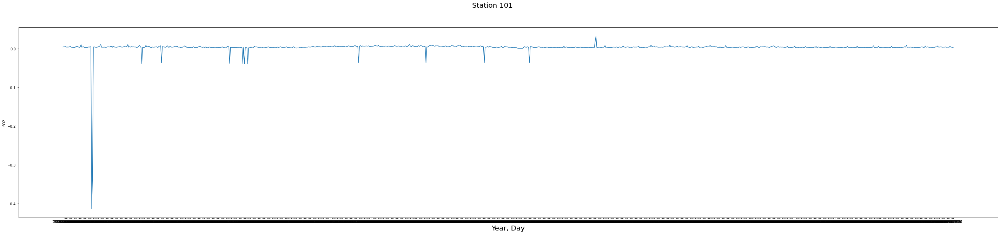

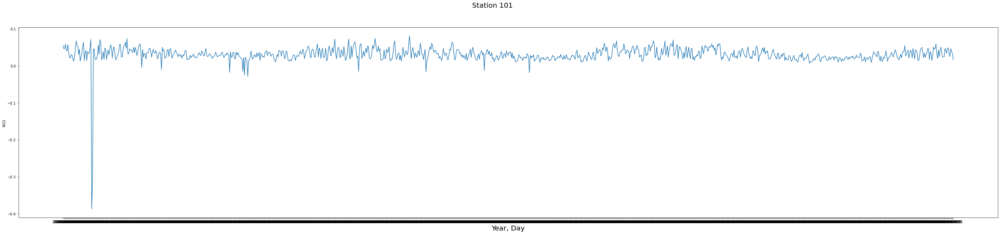

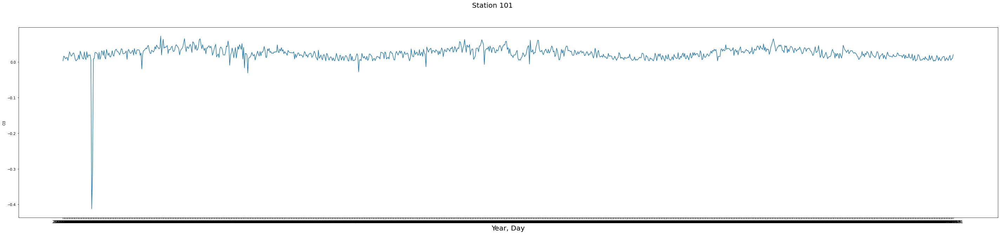

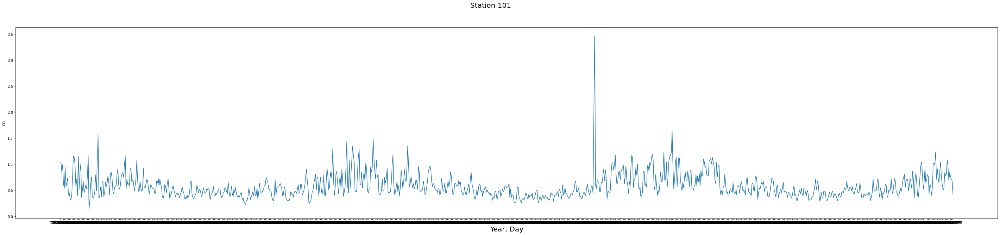

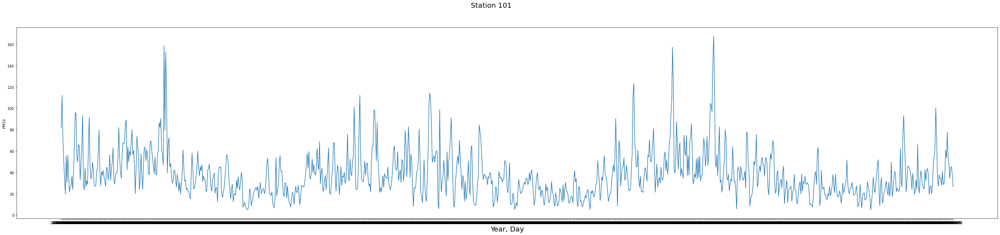

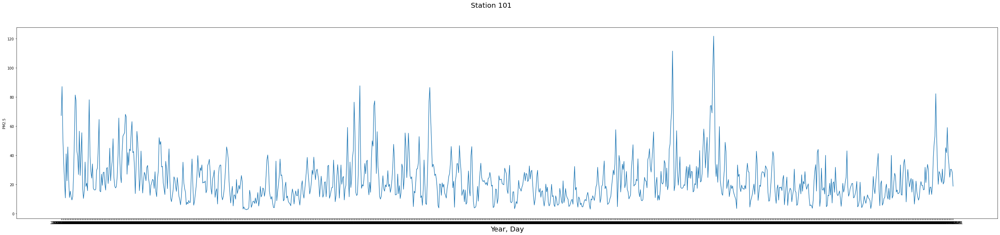

In [124]:
for feature in features:
    fig, ax = plt.subplots(figsize=(50,10))
    fig.suptitle("Station 101", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_101)

# Station 102

In [115]:
df_102 = df[df['Station code'] == 102]

In [116]:
df_102.tail()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
2165,102,2019-12-27,0.003167,0.022667,0.020417,0.495833,33.333333,28.250000,Good,Good,Good,Good,Normal,Normal
2166,102,2019-12-28,0.003625,0.043792,0.003833,0.695833,44.000000,32.833333,Good,Normal,Good,Good,Normal,Normal
2167,102,2019-12-29,0.003500,0.034958,0.008292,0.612500,44.958333,33.166667,Good,Normal,Good,Good,Normal,Normal
2168,102,2019-12-30,0.003083,0.029875,0.011833,0.600000,35.250000,29.791667,Good,Good,Good,Good,Normal,Normal
2169,102,2019-12-31,0.002375,0.013583,0.021542,0.375000,25.666667,18.041667,Good,Good,Good,Good,Good,Normal


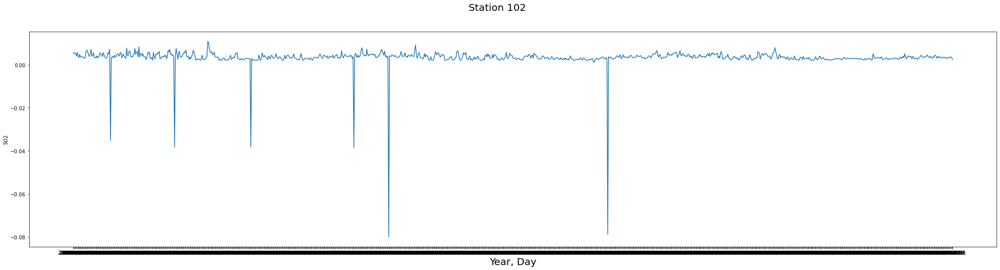

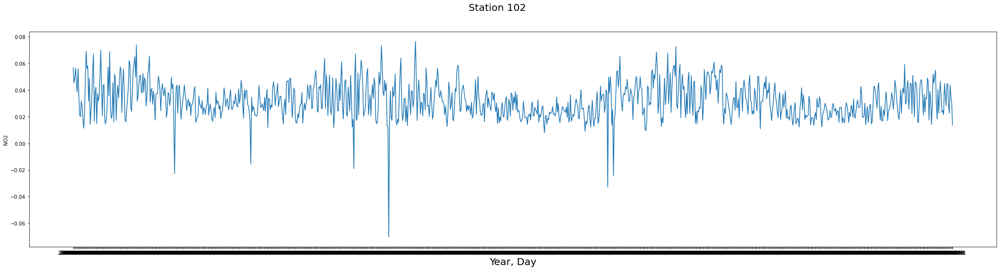

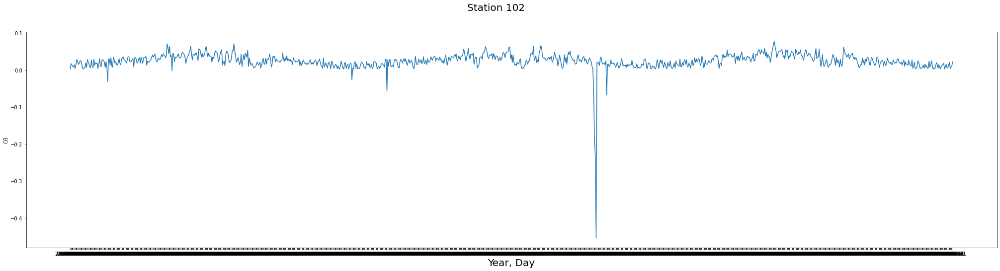

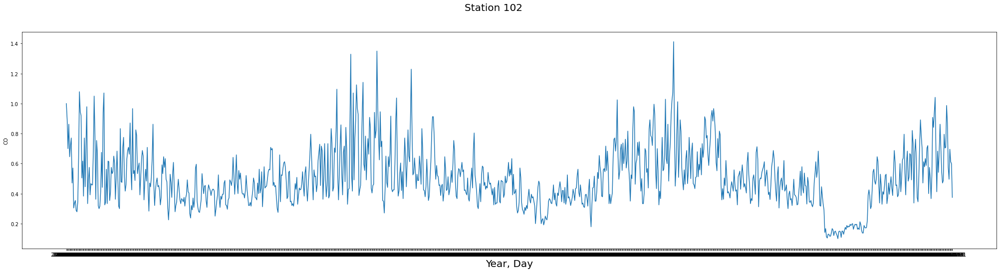

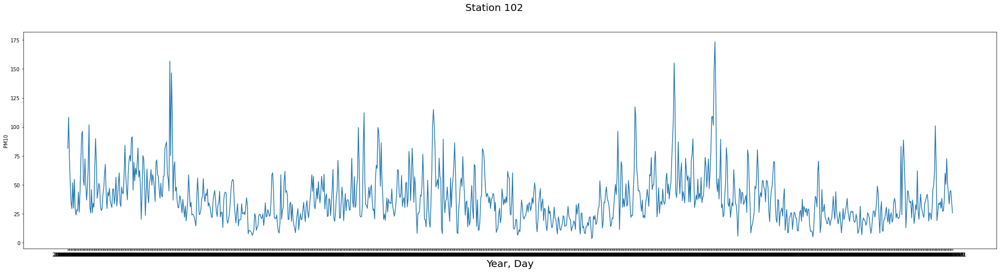

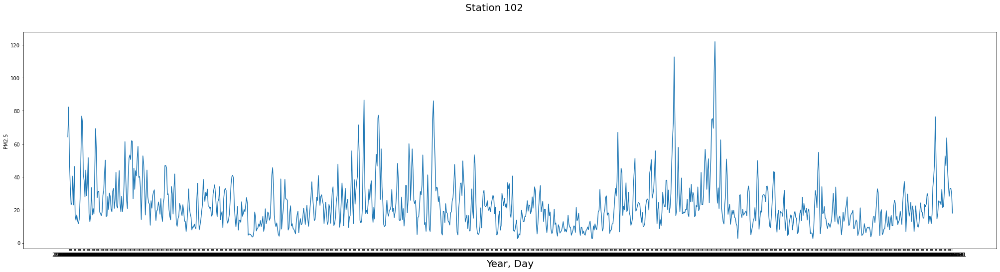

In [120]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 102", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_102)

# Station 103

In [40]:
df_103 = df[df['Station code'] == 103]

In [41]:
df_103.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
2170,103,2017-01-01,0.005042,0.039042,0.002500,1.112500,77.375000,73.125000,Good,Normal,Good,Good,Normal,Bad
2171,103,2017-01-02,0.006083,0.036417,0.013083,0.979167,105.458333,96.666667,Good,Normal,Good,Good,Bad,Very Bad
2172,103,2017-01-03,0.005375,0.035792,0.012625,0.791667,64.958333,54.375000,Good,Normal,Good,Good,Normal,Bad
2173,103,2017-01-04,0.005542,0.044167,0.006792,0.912500,49.208333,38.583333,Good,Normal,Good,Good,Normal,Bad
2174,103,2017-01-05,0.004292,0.029792,0.013417,0.633333,28.791667,23.083333,Good,Good,Good,Good,Good,Normal


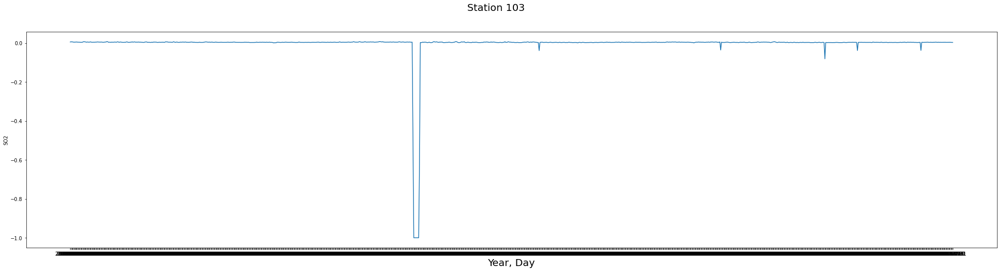

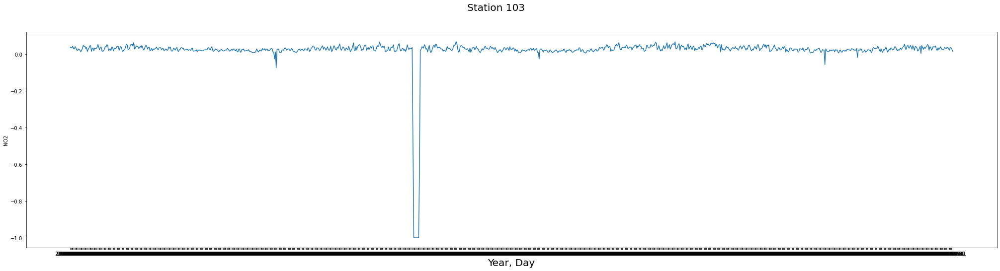

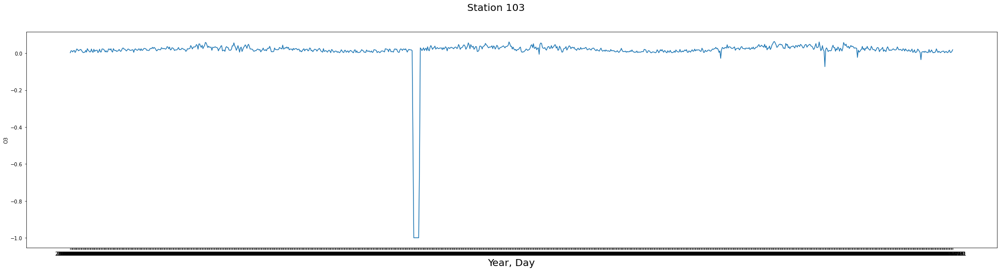

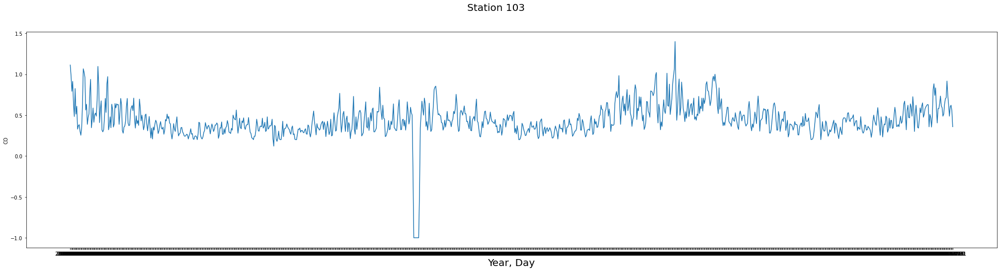

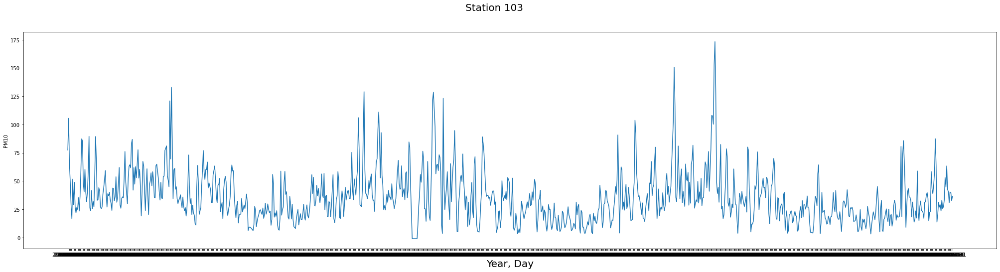

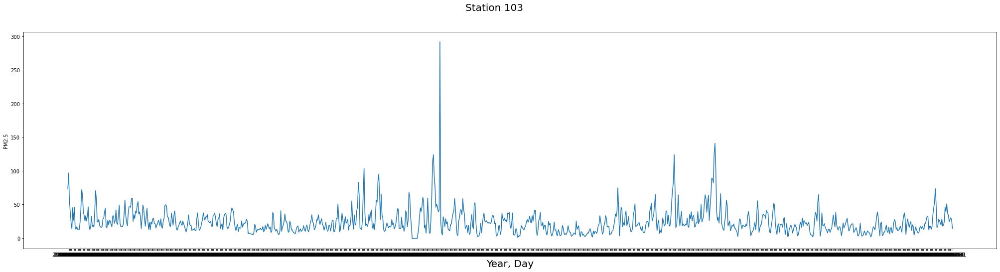

In [42]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 103", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_103)

# Station 104

In [43]:
df_104 = df[df['Station code'] == 104]

In [44]:
df_104.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
3255,104,2017-01-01,0.005958,0.041708,0.005458,0.708333,70.291667,45.541667,Good,Normal,Good,Good,Normal,Bad
3256,104,2017-01-02,0.006500,0.037333,0.019750,0.520833,102.416667,73.458333,Good,Normal,Good,Good,Bad,Bad
3257,104,2017-01-03,0.005333,0.038292,0.016167,0.262500,73.625000,46.875000,Good,Normal,Good,Good,Normal,Bad
3258,104,2017-01-04,0.004750,0.033625,0.006375,0.537500,46.333333,29.041667,Good,Normal,Good,Good,Normal,Normal
3259,104,2017-01-05,0.003917,0.014083,0.008833,0.625000,32.083333,20.041667,Good,Good,Good,Good,Normal,Normal


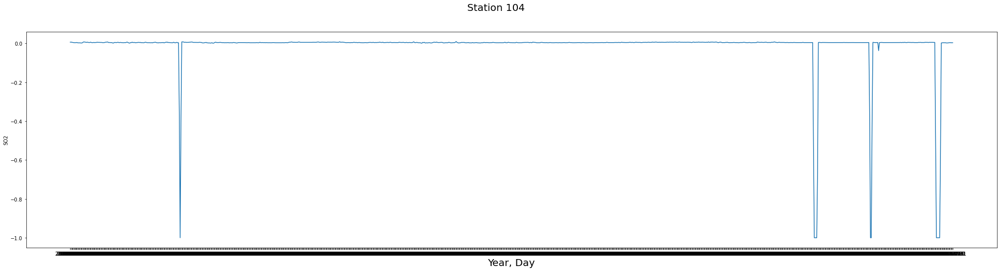

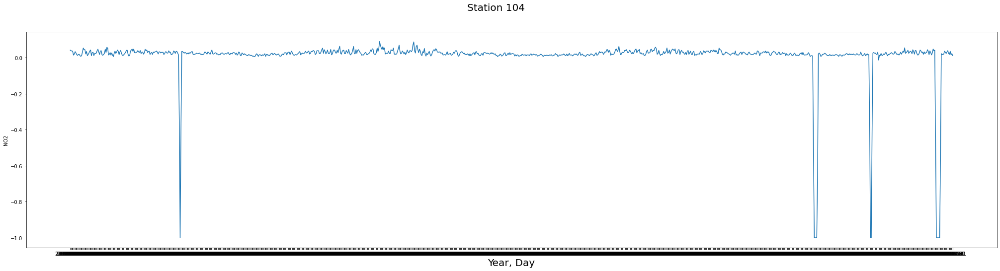

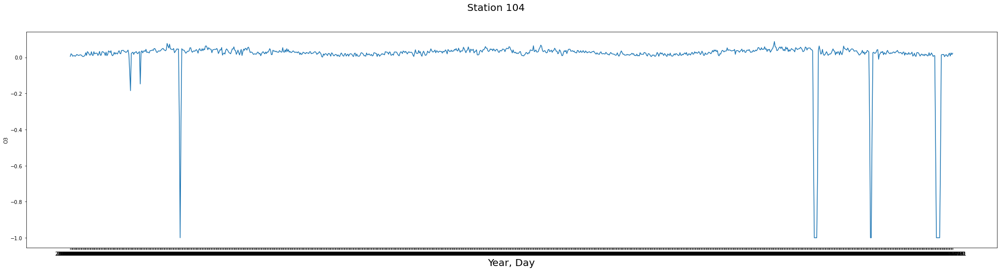

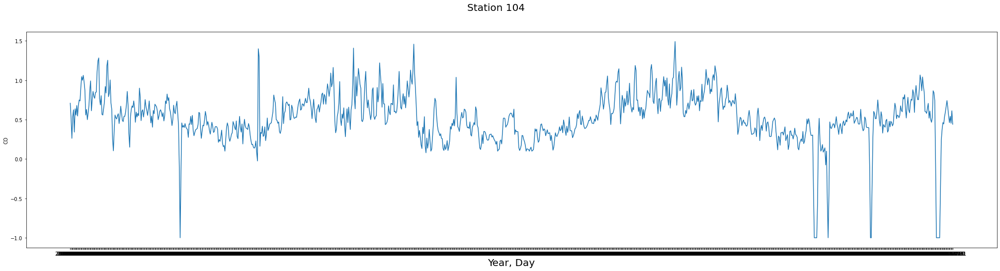

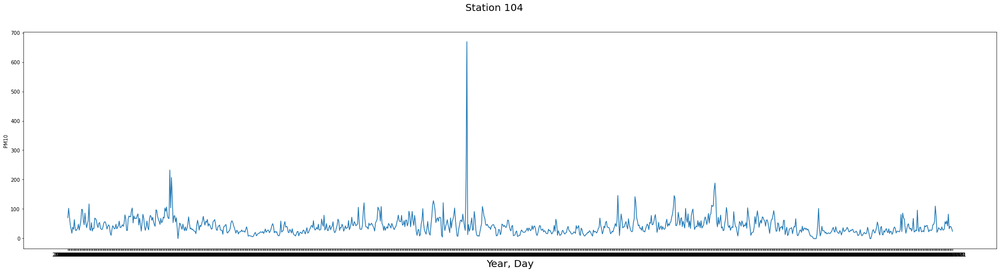

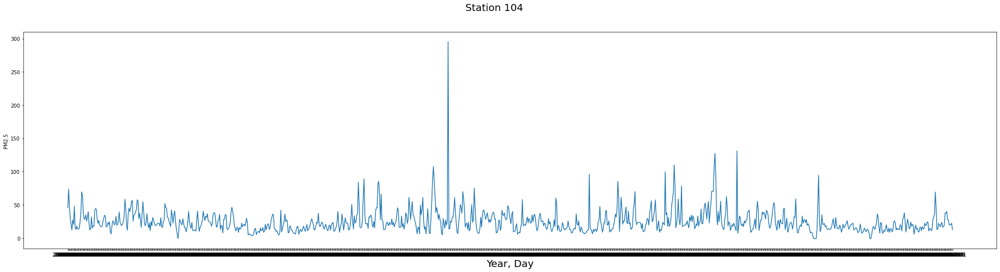

In [45]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 104", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_104)

# Station 105

In [46]:
df_105 = df[df['Station code'] == 105]

In [47]:
df_105.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
4340,105,2017-01-01,0.005250,0.038500,0.007625,0.783333,91.291667,49.541667,Good,Normal,Good,Good,Bad,Bad
4341,105,2017-01-02,0.005625,0.032708,0.020208,0.741667,126.333333,64.291667,Good,Normal,Good,Good,Bad,Bad
4342,105,2017-01-03,0.006250,0.033292,0.016417,0.683333,90.291667,40.166667,Good,Normal,Good,Good,Bad,Bad
4343,105,2017-01-04,0.006000,0.040000,0.013167,0.783333,60.458333,32.166667,Good,Normal,Good,Good,Normal,Normal
4344,105,2017-01-05,0.005292,0.025917,0.021042,0.591667,27.333333,17.541667,Good,Good,Good,Good,Good,Normal


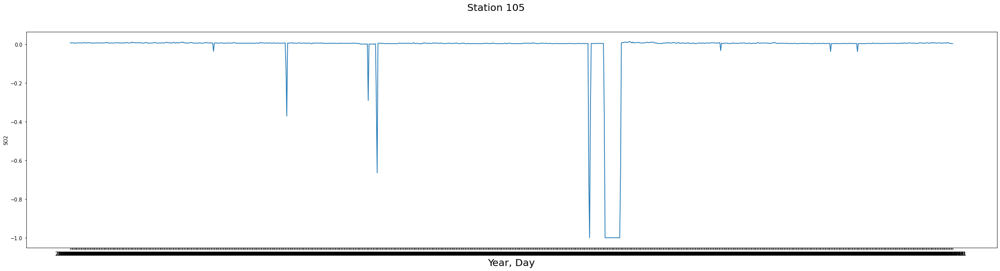

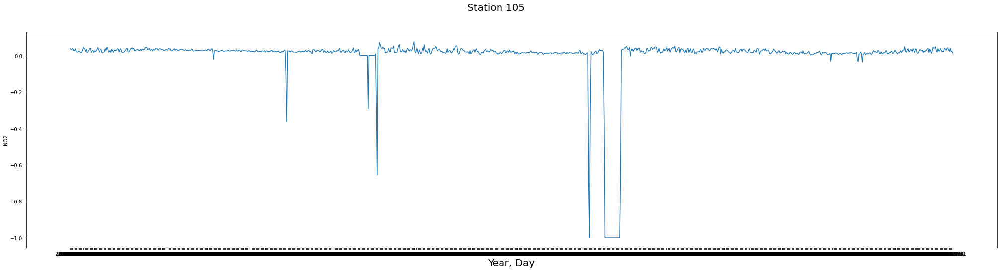

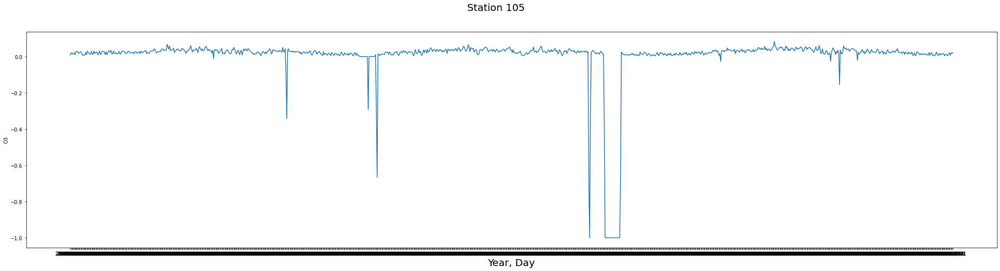

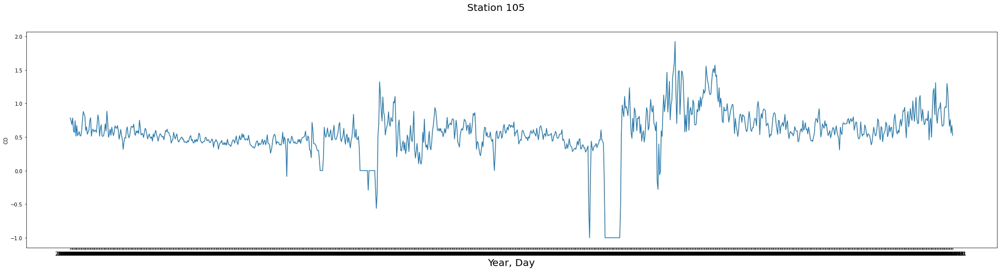

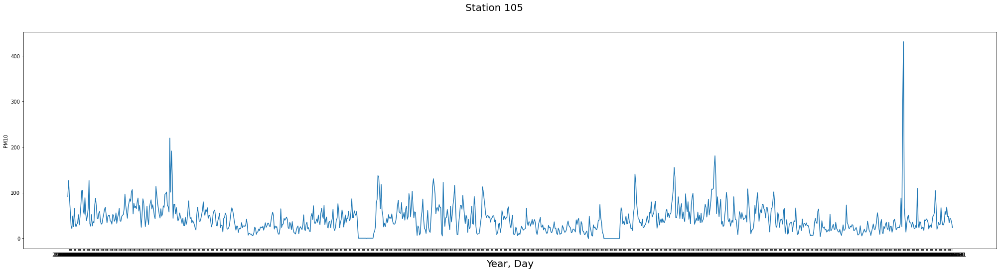

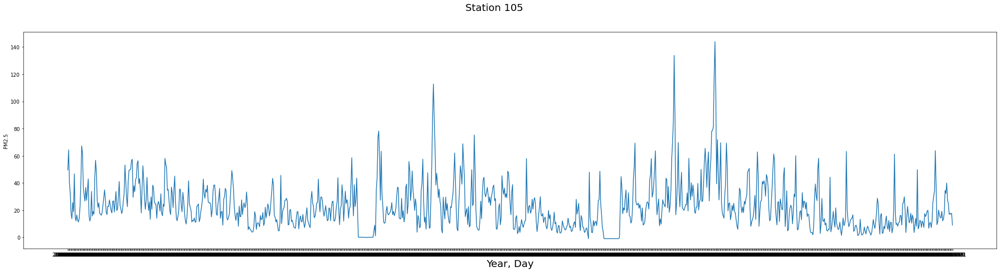

In [48]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 105", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_105)

# Station 106

In [49]:
df_106 = df[df['Station code'] == 106]

In [50]:
df_106.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
5425,106,2017-01-01,0.004792,0.054917,0.004083,1.162500,76.083333,68.000000,Good,Normal,Good,Good,Normal,Bad
5426,106,2017-01-02,0.005167,0.045500,0.014500,1.070833,103.333333,91.041667,Good,Normal,Good,Good,Bad,Very Bad
5427,106,2017-01-03,0.005083,0.048125,0.012458,0.900000,66.375000,54.708333,Good,Normal,Good,Good,Normal,Bad
5428,106,2017-01-04,0.005125,0.058458,0.009000,1.041667,49.125000,39.500000,Good,Normal,Good,Good,Normal,Bad
5429,106,2017-01-05,0.003917,0.041875,0.011000,0.750000,31.750000,24.250000,Good,Normal,Good,Good,Normal,Normal


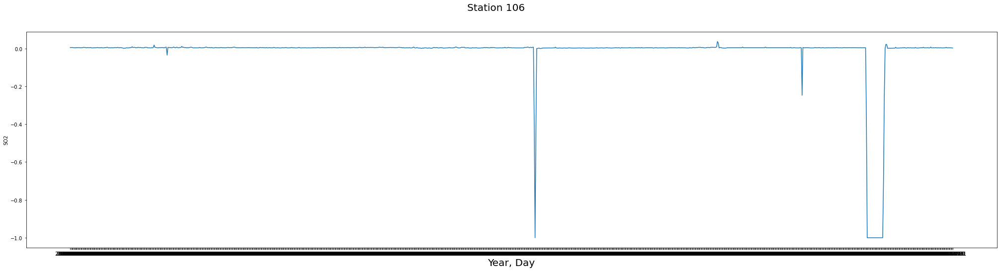

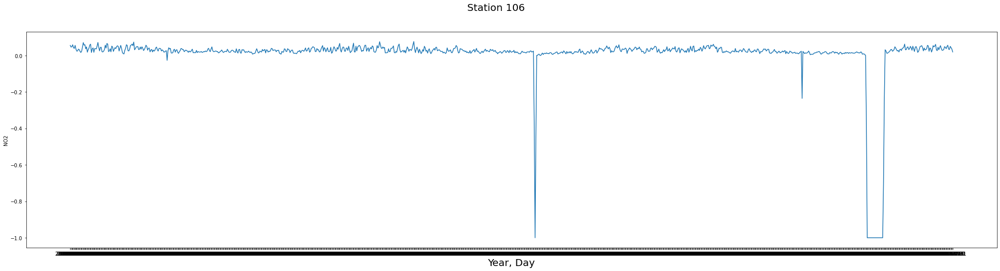

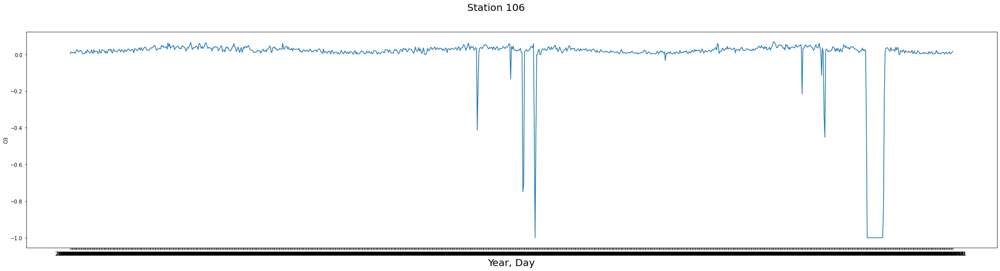

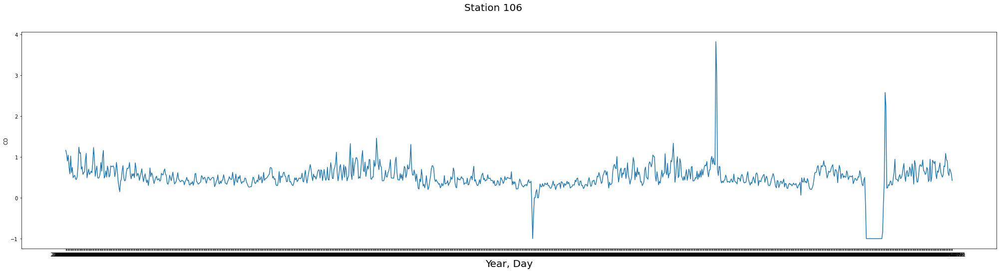

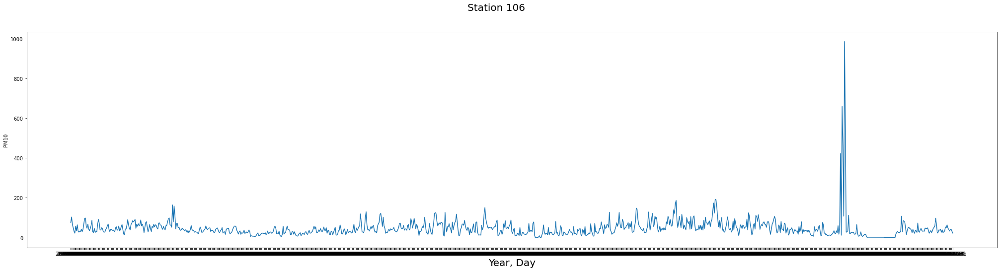

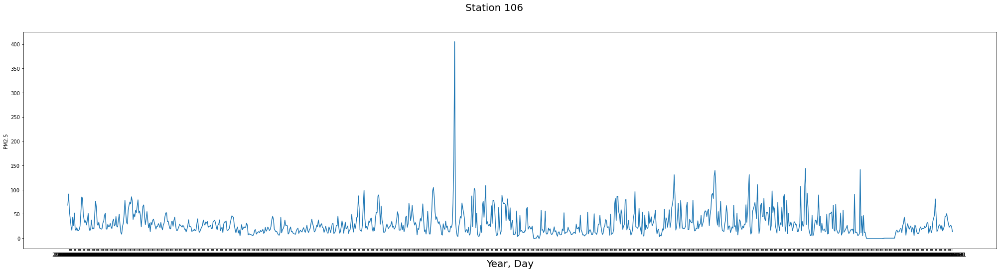

In [51]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 106", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_106)

# Station 107

In [52]:
df_107 = df[df['Station code'] == 107]

In [53]:
df_107.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
6510,107,2017-01-01,0.004500,0.045458,0.002875,0.791667,76.916667,52.916667,Good,Normal,Good,Good,Normal,Bad
6511,107,2017-01-02,0.005083,0.038042,0.013875,0.666667,111.500000,80.125000,Good,Normal,Good,Good,Bad,Very Bad
6512,107,2017-01-03,0.004917,0.045583,0.011208,0.525000,82.291667,51.875000,Good,Normal,Good,Good,Bad,Bad
6513,107,2017-01-04,0.005208,0.056500,0.006208,0.604167,58.291667,35.458333,Good,Normal,Good,Good,Normal,Bad
6514,107,2017-01-05,0.004417,0.033125,0.014083,0.450000,39.291667,22.833333,Good,Normal,Good,Good,Normal,Normal


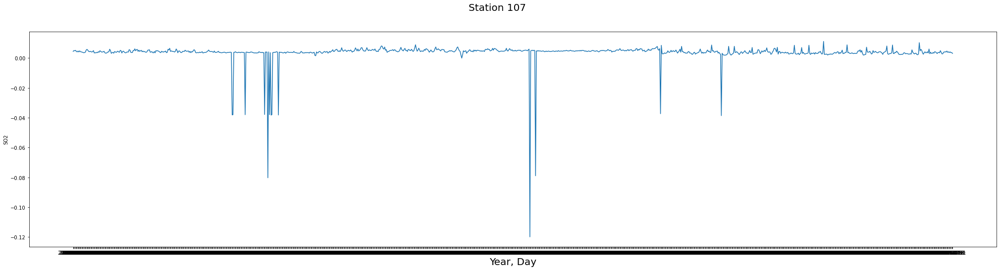

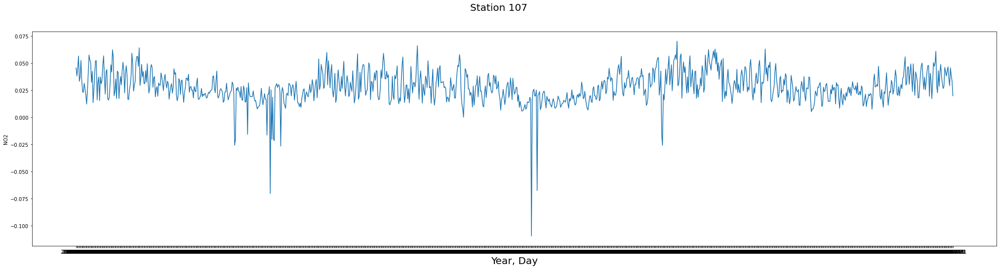

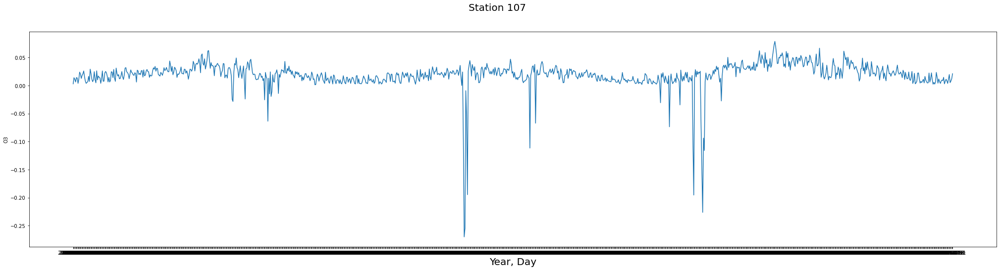

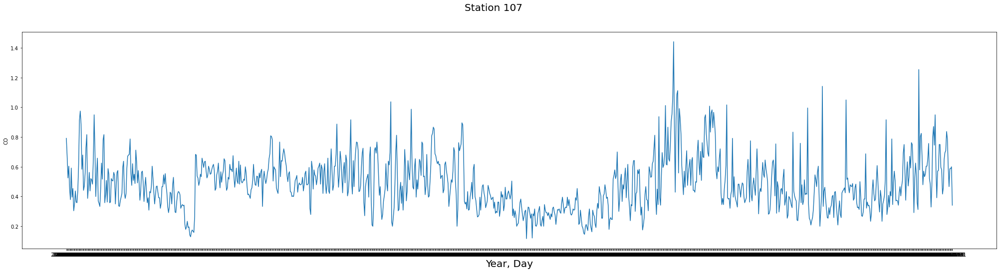

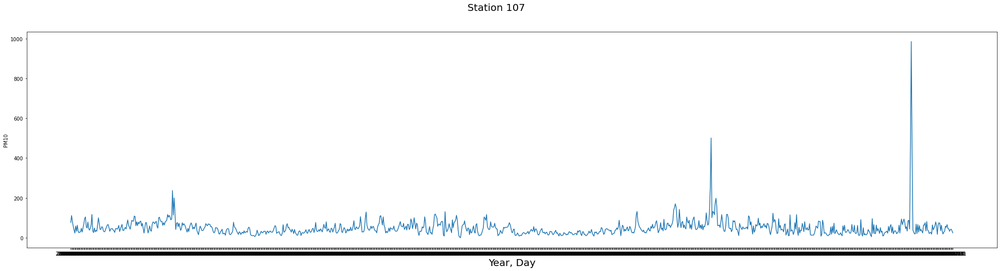

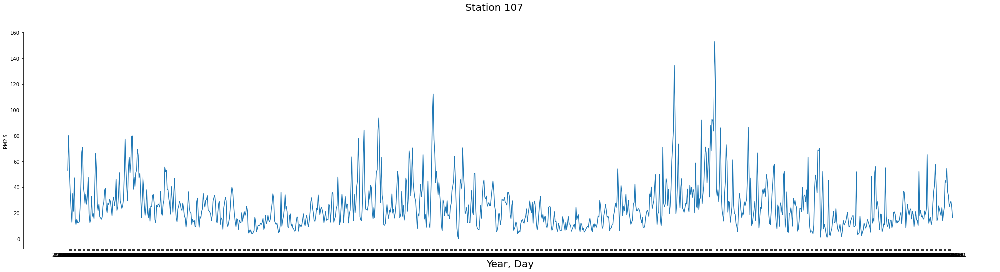

In [54]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 107", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_107)

# Station 108

In [55]:
df_108 = df[df['Station code'] == 108]

In [56]:
df_108.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
7595,108,2017-01-01,0.004375,0.044542,0.005042,0.812500,79.708333,71.333333,Good,Normal,Good,Good,Normal,Bad
7596,108,2017-01-02,0.005208,0.044792,0.019208,0.900000,110.750000,95.458333,Good,Normal,Good,Good,Bad,Very Bad
7597,108,2017-01-03,0.004875,0.047708,0.015875,0.862500,85.750000,69.041667,Good,Normal,Good,Good,Bad,Bad
7598,108,2017-01-04,0.006083,0.055833,0.008042,0.945833,55.875000,41.250000,Good,Normal,Good,Good,Normal,Bad
7599,108,2017-01-05,0.004000,0.033042,0.017125,0.612500,32.583333,21.750000,Good,Normal,Good,Good,Normal,Normal


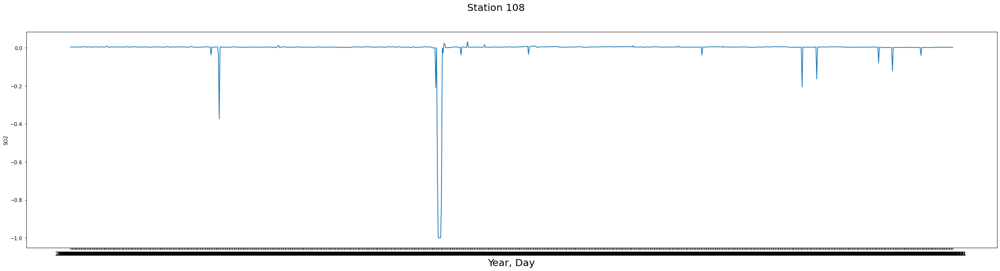

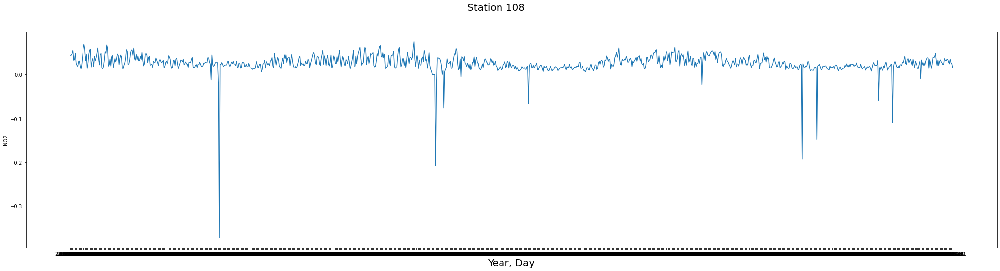

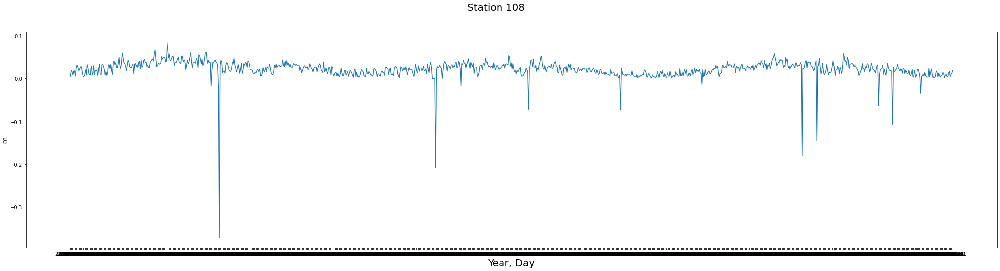

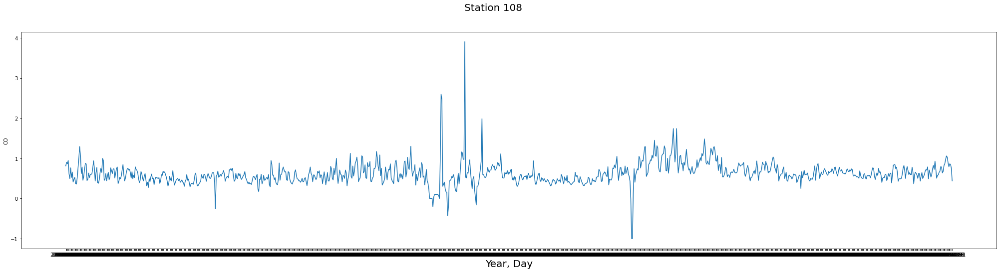

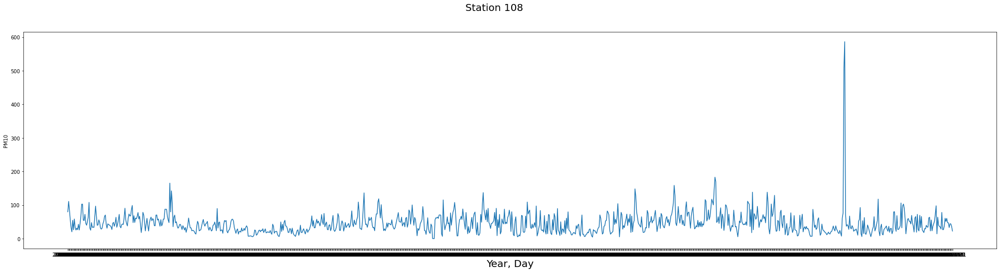

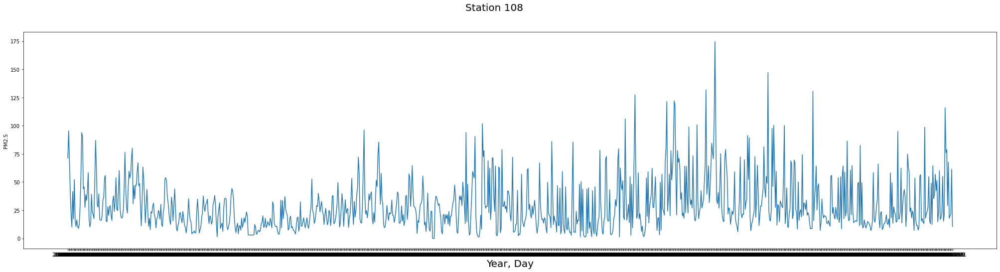

In [57]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 108", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_108)

# Station 109

In [58]:
df_109 = df[df['Station code'] == 109]

In [59]:
df_109.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
8680,109,2017-01-01,0.005583,0.046292,0.002917,1.016667,87.083333,62.250000,Good,Normal,Good,Good,Bad,Bad
8681,109,2017-01-02,0.005625,0.039417,0.012250,1.041667,128.041667,89.250000,Good,Normal,Good,Good,Bad,Very Bad
8682,109,2017-01-03,0.006042,0.043958,0.010042,0.945833,91.958333,62.583333,Good,Normal,Good,Good,Bad,Bad
8683,109,2017-01-04,0.006250,0.051583,0.007208,0.995833,55.958333,34.791667,Good,Normal,Good,Good,Normal,Normal
8684,109,2017-01-05,0.005292,0.040375,0.006667,0.804167,43.416667,24.458333,Good,Normal,Good,Good,Normal,Normal


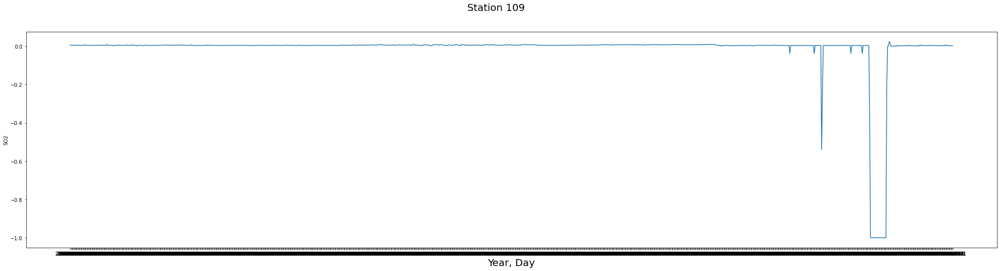

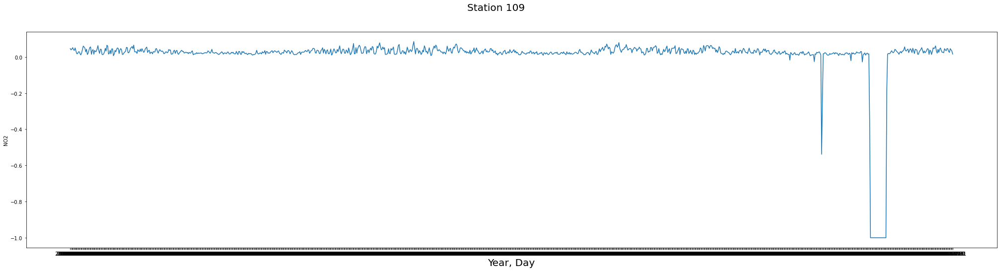

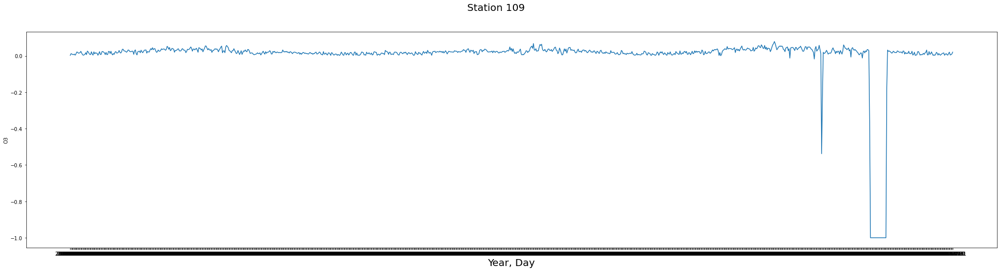

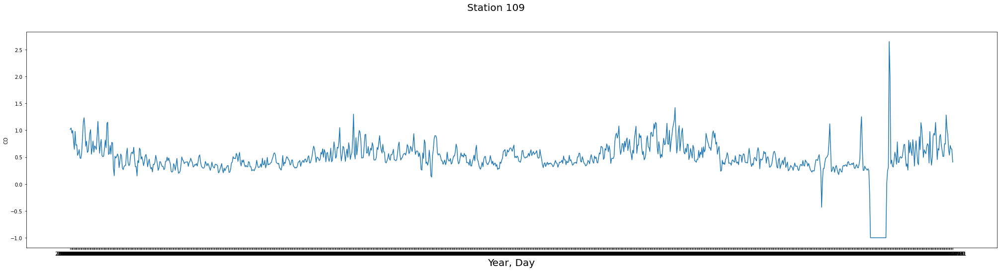

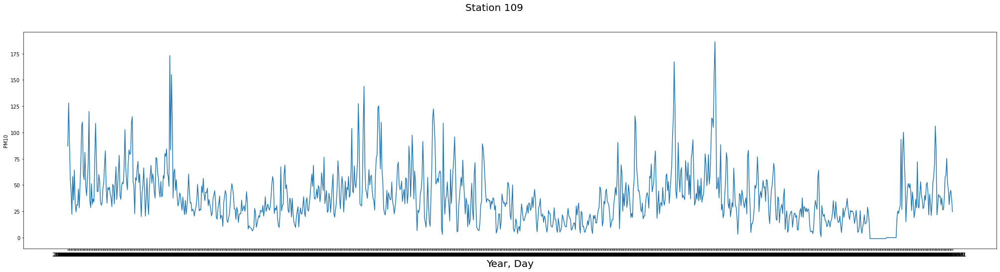

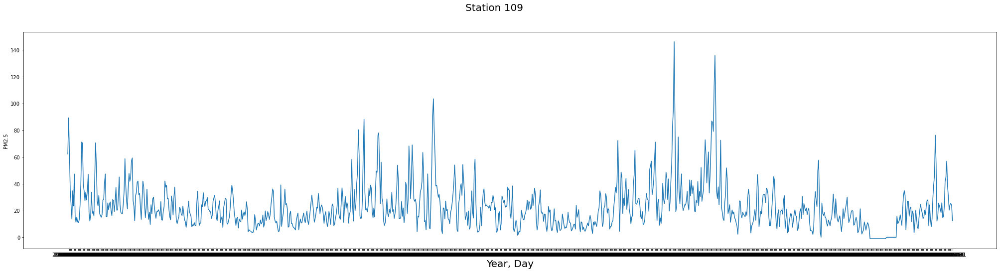

In [60]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 109", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_109)

# Station 110

In [61]:
df_110 = df[df['Station code'] == 110]

In [62]:
df_110.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
9765,110,2017-01-01,0.005250,0.040792,0.004542,0.795833,80.166667,63.750000,Good,Normal,Good,Good,Bad,Bad
9766,110,2017-01-02,0.005417,0.040958,0.013583,0.866667,122.166667,94.583333,Good,Normal,Good,Good,Bad,Very Bad
9767,110,2017-01-03,0.004875,0.043542,0.008250,0.716667,93.916667,69.458333,Good,Normal,Good,Good,Bad,Bad
9768,110,2017-01-04,0.005667,0.052417,0.005917,0.779167,60.625000,38.666667,Good,Normal,Good,Good,Normal,Bad
9769,110,2017-01-05,0.005000,0.031375,0.014208,0.520833,38.333333,23.291667,Good,Normal,Good,Good,Normal,Normal


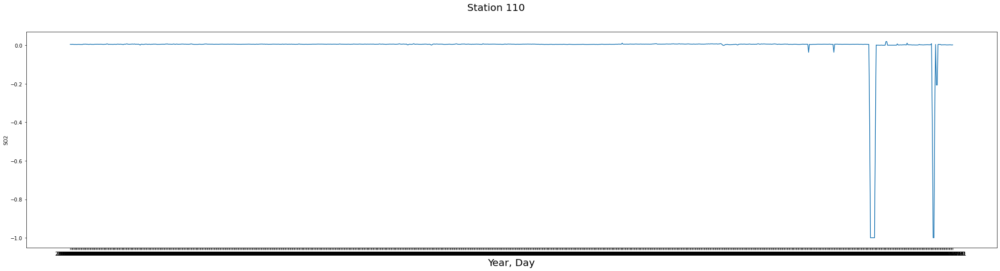

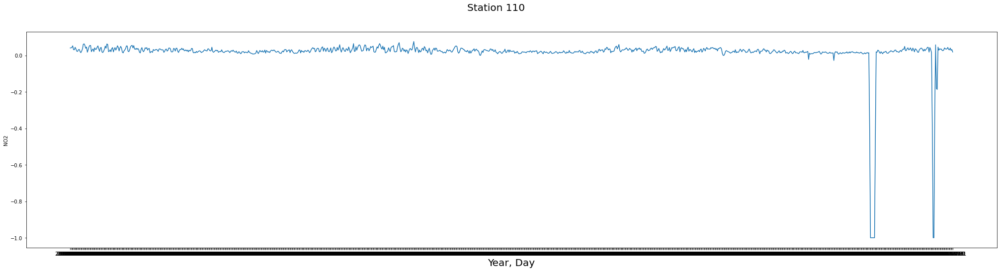

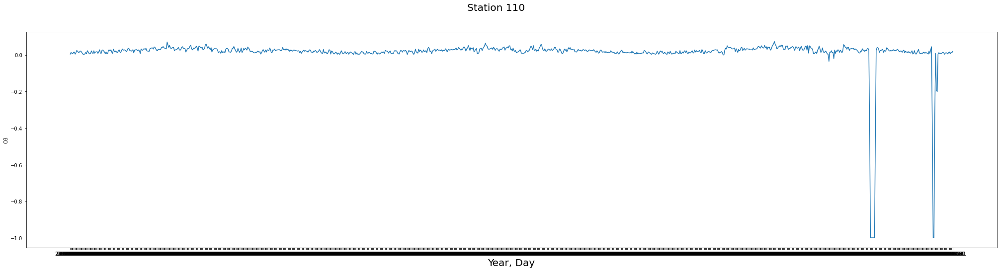

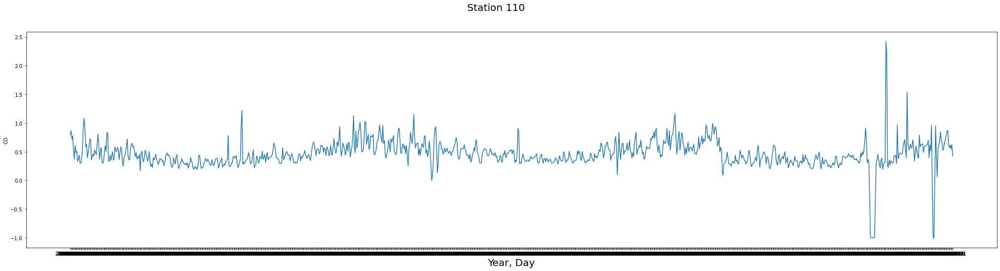

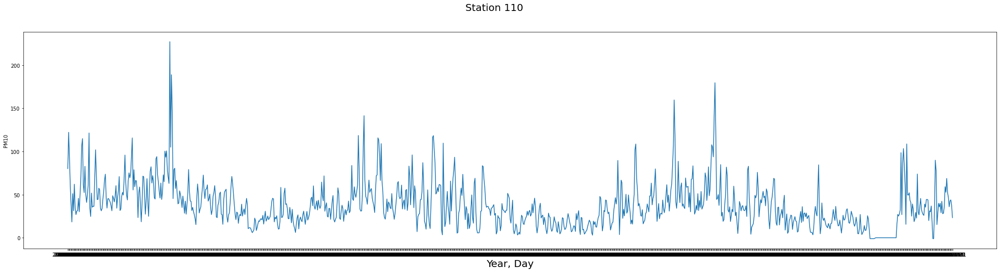

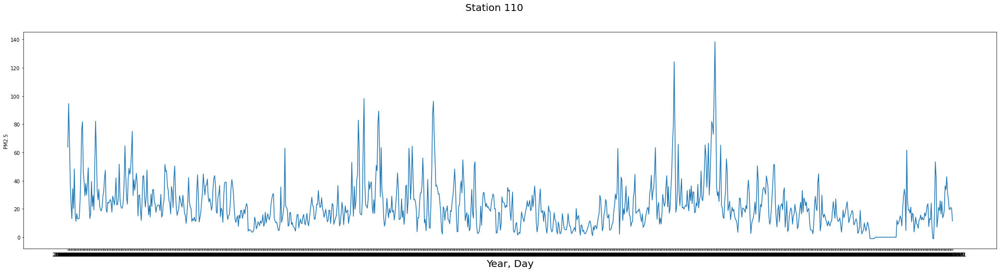

In [63]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 110", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_110)

# Station 111

In [64]:
df_111 = df[df['Station code'] == 111]

In [65]:
df_111.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
10850,111,2017-01-01,0.004917,0.047708,0.002625,0.916667,65.750000,43.708333,Good,Normal,Good,Good,Normal,Bad
10851,111,2017-01-02,0.005750,0.043375,0.010958,0.929167,98.791667,62.375000,Good,Normal,Good,Good,Bad,Bad
10852,111,2017-01-03,0.006083,0.050417,0.008583,0.866667,101.083333,58.666667,Good,Normal,Good,Good,Bad,Bad
10853,111,2017-01-04,0.005750,0.056250,0.007083,0.945833,60.375000,30.833333,Good,Normal,Good,Good,Normal,Normal
10854,111,2017-01-05,0.004542,0.040375,0.007792,0.645833,50.708333,24.625000,Good,Normal,Good,Good,Normal,Normal


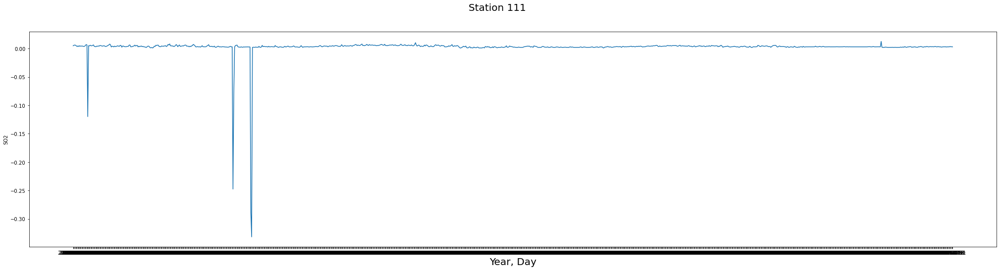

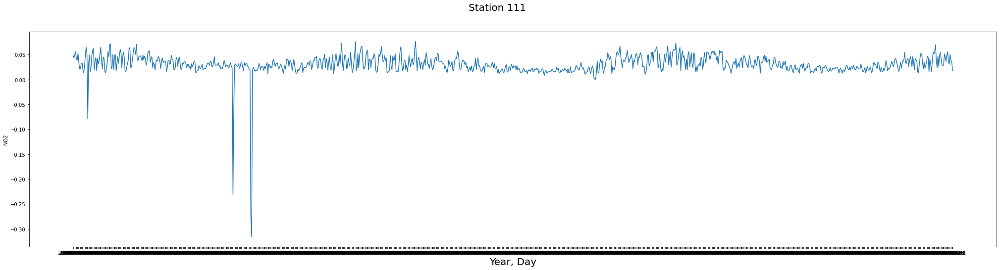

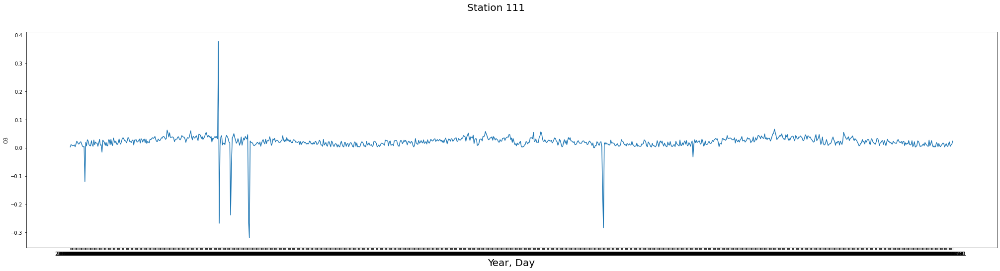

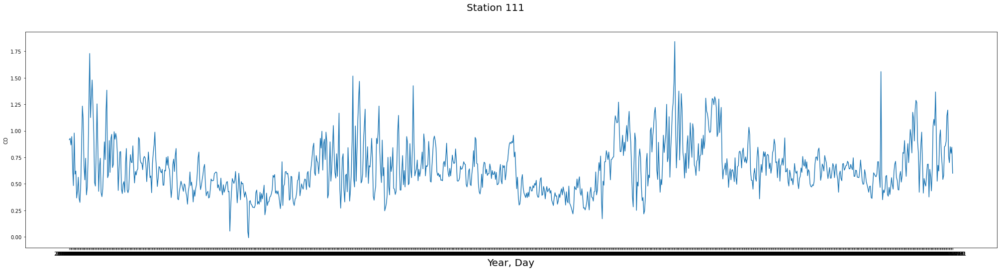

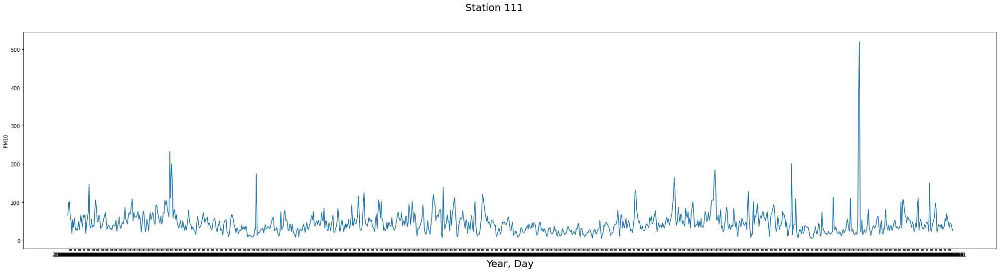

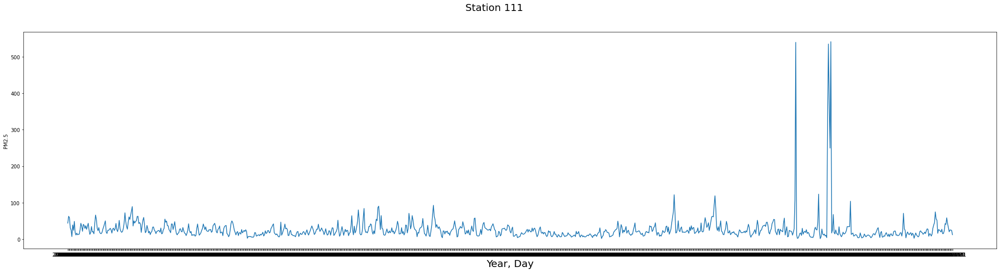

In [66]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 111", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_111)

# Station 112

In [67]:
df_112 = df[df['Station code'] == 112]

In [68]:
df_112.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
11935,112,2017-01-01,0.004875,0.046375,0.002625,0.858333,78.166667,65.208333,Good,Normal,Good,Good,Normal,Bad
11936,112,2017-01-02,0.008542,0.033792,0.022875,0.966667,102.916667,85.291667,Good,Normal,Good,Good,Bad,Very Bad
11937,112,2017-01-03,0.006000,0.038917,0.014958,0.729167,77.875000,59.791667,Good,Normal,Good,Good,Normal,Bad
11938,112,2017-01-04,0.006667,0.044125,0.013792,0.808333,43.583333,33.291667,Good,Normal,Good,Good,Normal,Normal
11939,112,2017-01-05,0.005000,0.030375,0.013458,0.591667,27.500000,20.291667,Good,Normal,Good,Good,Good,Normal


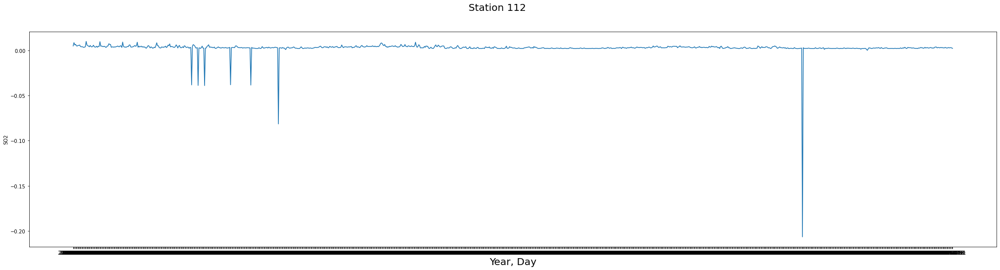

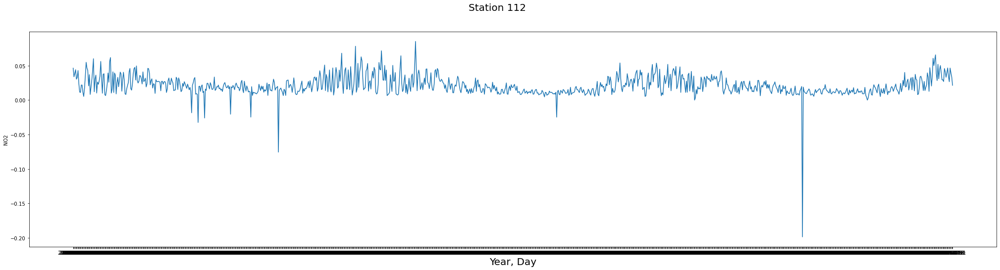

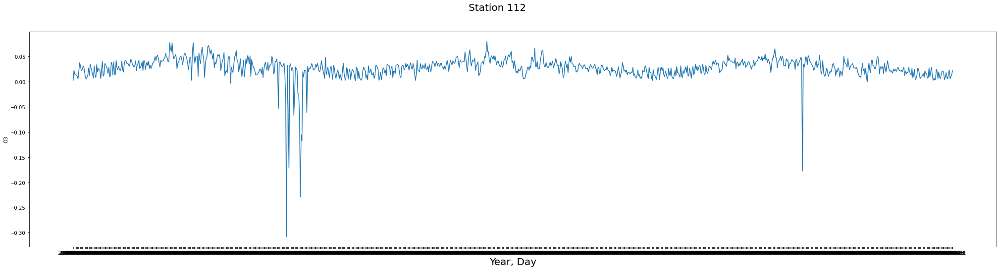

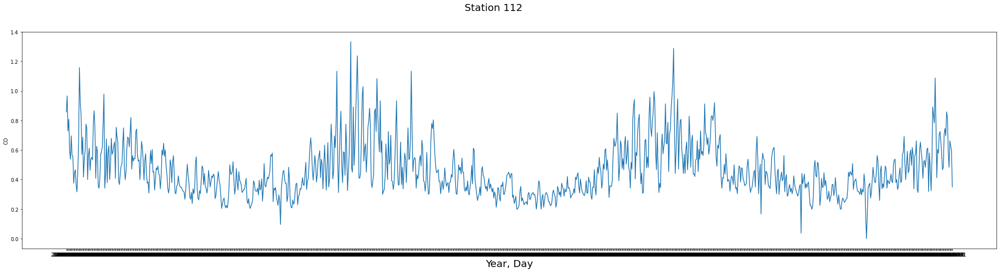

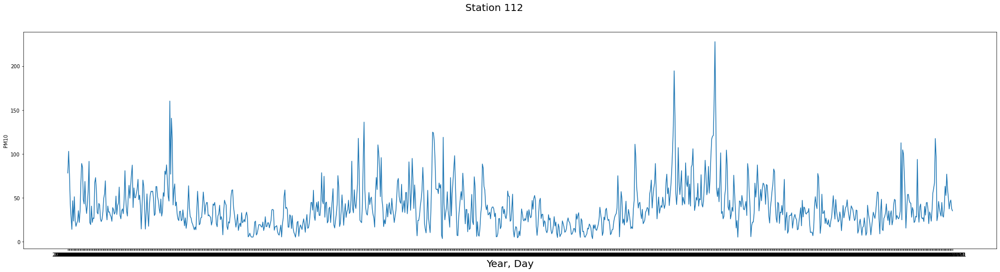

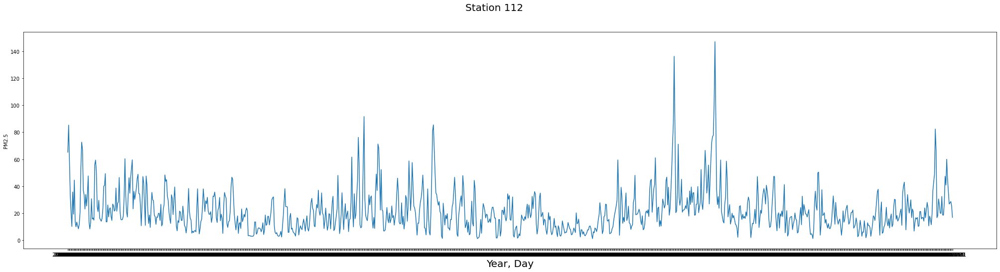

In [69]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 112", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_112)

# Station 113

In [70]:
df_113 = df[df['Station code'] == 113]

In [71]:
df_113.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
13020,113,2017-01-01,-0.036250,0.008292,-0.038708,0.833333,75.000000,45.083333,Good,Good,Good,Good,Normal,Bad
13021,113,2017-01-02,-0.035292,-0.003375,-0.021250,0.812500,110.833333,67.000000,Good,Good,Good,Good,Bad,Bad
13022,113,2017-01-03,0.006708,0.043875,0.016083,0.891667,93.125000,55.583333,Good,Normal,Good,Good,Bad,Bad
13023,113,2017-01-04,-0.035083,0.008333,-0.030708,0.875000,51.500000,30.291667,Good,Good,Good,Good,Normal,Normal
13024,113,2017-01-05,-0.036750,-0.010250,-0.027792,0.541667,40.458333,21.958333,Good,Good,Good,Good,Normal,Normal


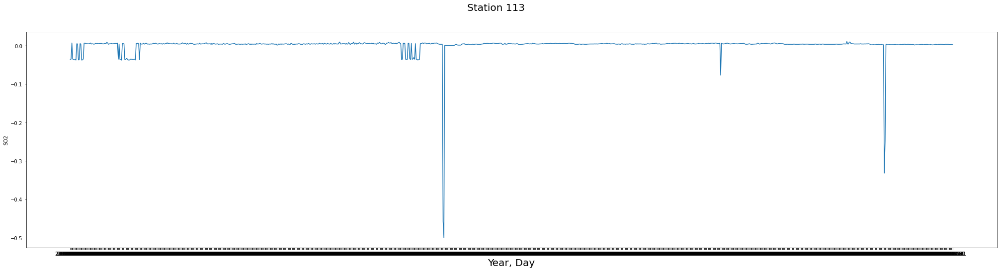

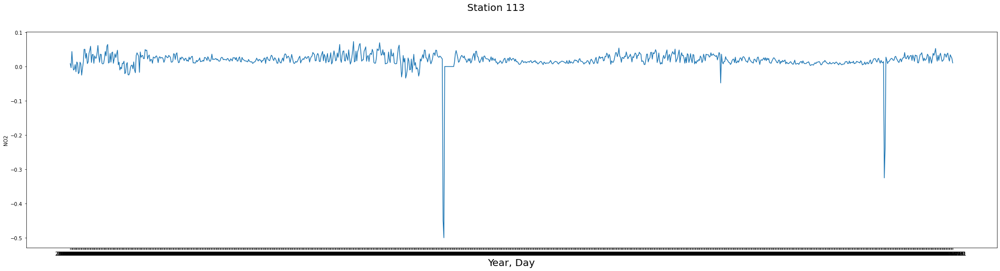

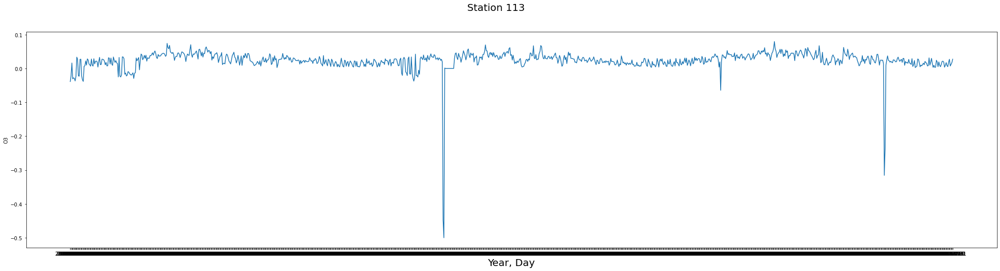

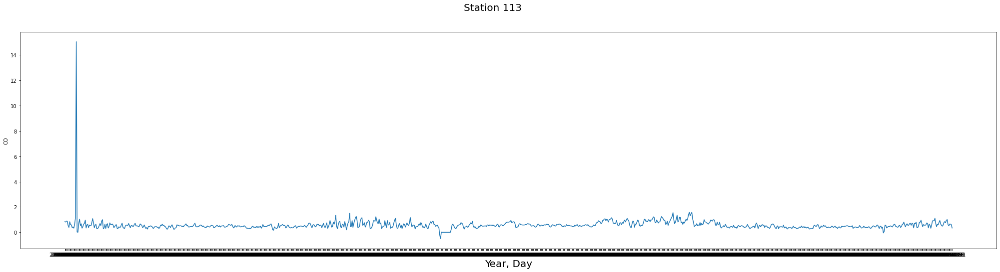

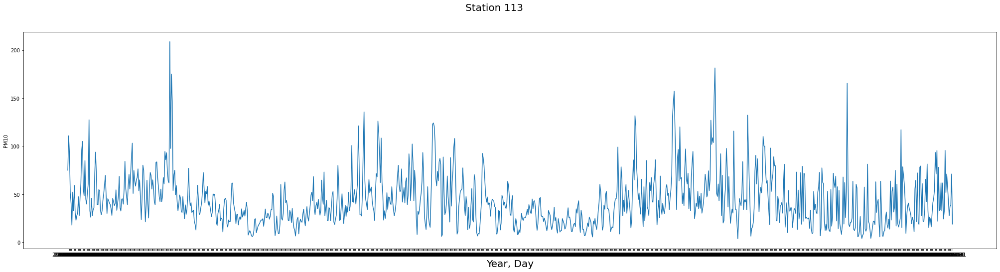

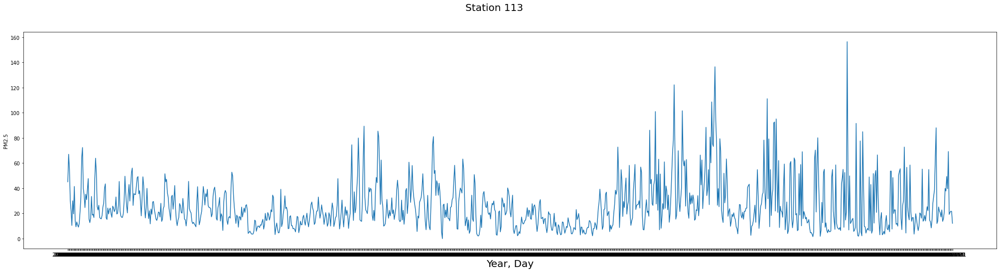

In [72]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 113", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_113)

# Station 114

In [73]:
df_114 = df[df['Station code'] == 114]

In [74]:
df_114.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
14105,114,2017-01-01,0.007958,0.052375,0.003875,1.191667,82.125000,65.208333,Good,Normal,Good,Good,Bad,Bad
14106,114,2017-01-02,0.007542,0.040375,0.020042,0.912500,105.083333,82.208333,Good,Normal,Good,Good,Bad,Very Bad
14107,114,2017-01-03,0.006792,0.053958,0.009333,1.037500,84.791667,63.625000,Good,Normal,Good,Good,Bad,Bad
14108,114,2017-01-04,0.006292,0.055250,0.010167,0.945833,49.041667,33.625000,Good,Normal,Good,Good,Normal,Normal
14109,114,2017-01-05,0.006667,0.038000,0.014500,0.812500,36.541667,24.166667,Good,Normal,Good,Good,Normal,Normal


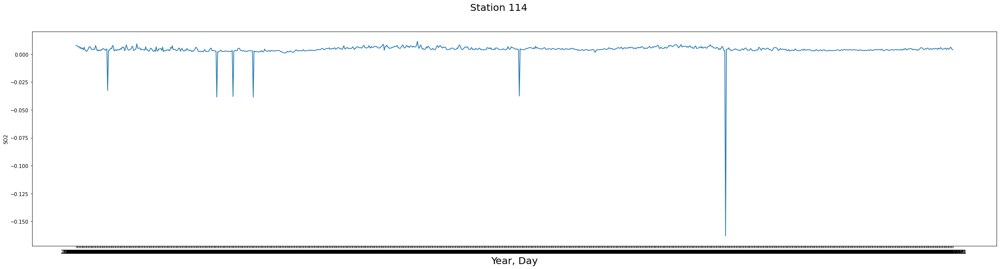

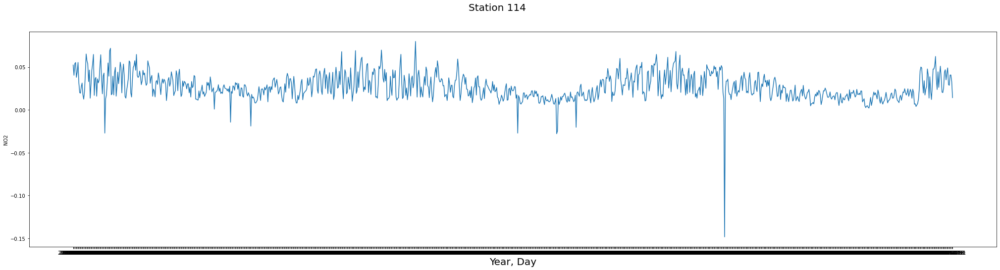

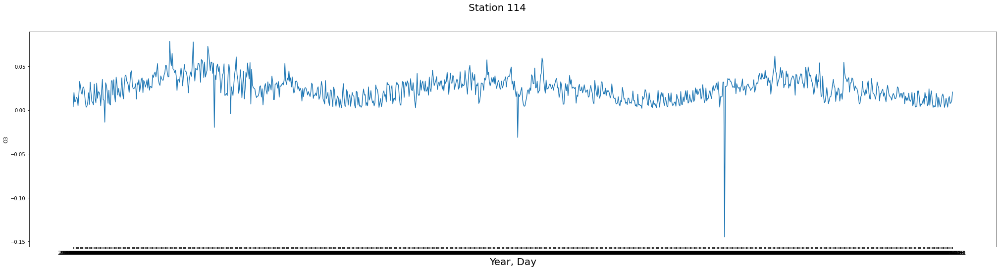

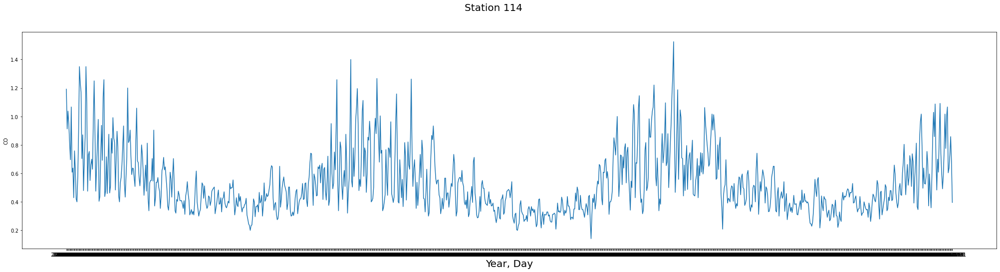

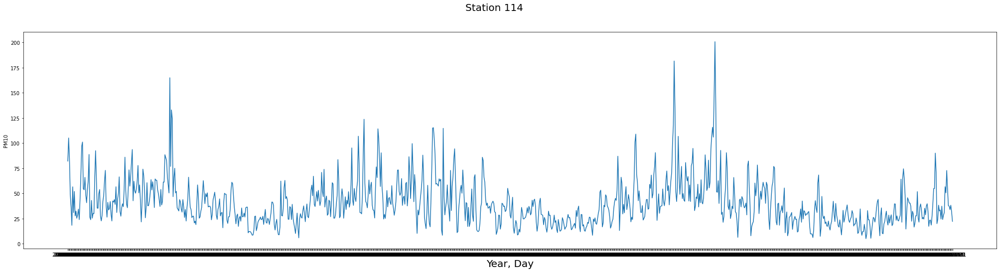

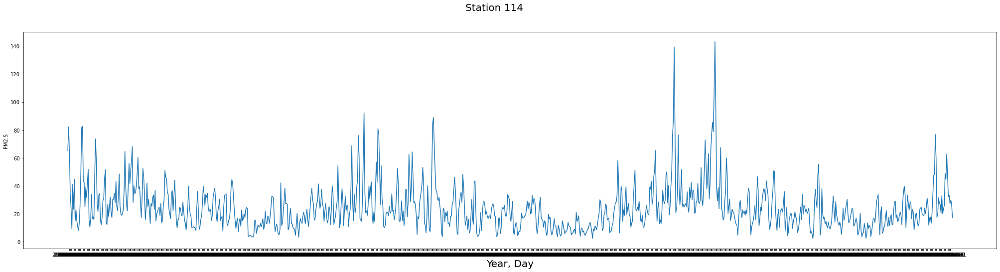

In [75]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 114", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_114)

# Station 115

In [76]:
df_115 = df[df['Station code'] == 115]

In [77]:
df_115.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
15190,115,2017-01-01,0.005125,0.046375,0.003625,1.058333,79.625000,51.041667,Good,Normal,Good,Good,Normal,Bad
15191,115,2017-01-02,0.005167,0.039167,0.011125,0.875000,106.958333,62.791667,Good,Normal,Good,Good,Bad,Bad
15192,115,2017-01-03,0.004833,0.040625,0.007750,0.816667,73.166667,38.416667,Good,Normal,Good,Good,Normal,Bad
15193,115,2017-01-04,0.006417,0.049500,0.006417,0.970833,58.375000,31.500000,Good,Normal,Good,Good,Normal,Normal
15194,115,2017-01-05,0.004958,0.039167,0.006083,0.820833,39.000000,20.291667,Good,Normal,Good,Good,Normal,Normal


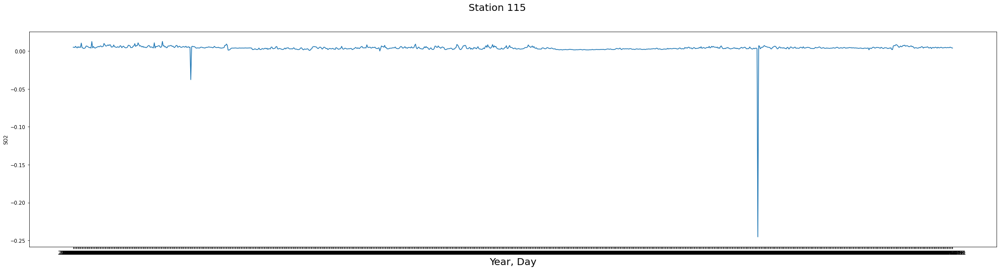

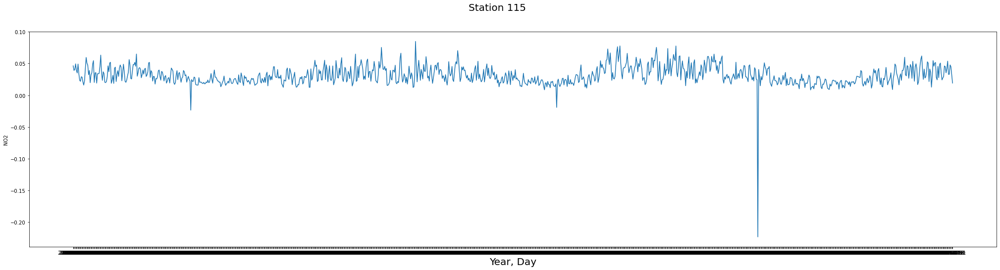

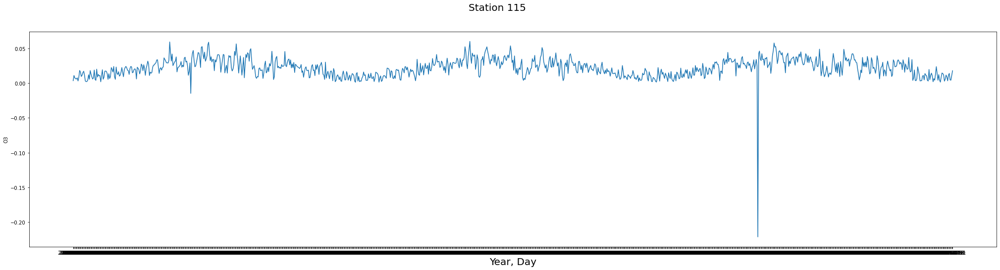

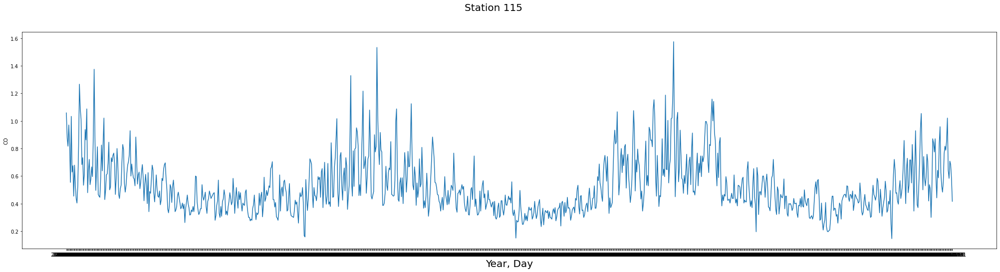

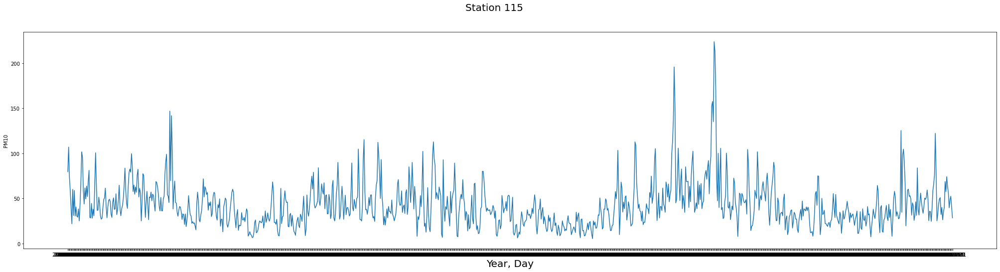

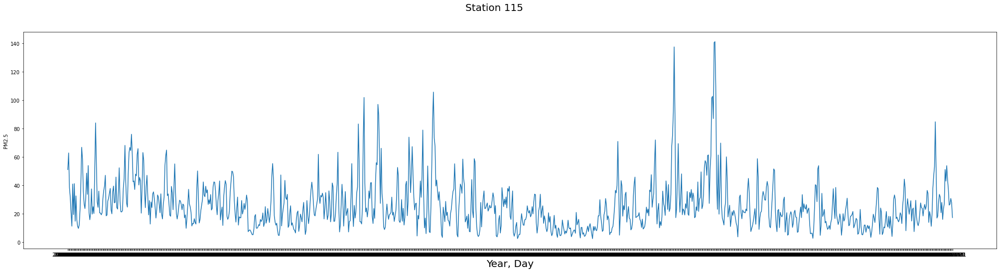

In [78]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 115", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_115)

# Station 116

In [79]:
df_116 = df[df['Station code'] == 116]

In [80]:
df_116.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
16275,116,2017-01-01,0.006292,0.053292,0.005250,0.962500,75.125000,53.708333,Good,Normal,Good,Good,Normal,Bad
16276,116,2017-01-02,0.006500,0.036500,0.017833,0.683333,107.083333,71.000000,Good,Normal,Good,Good,Bad,Bad
16277,116,2017-01-03,0.006875,0.044125,0.012542,0.716667,75.208333,45.875000,Good,Normal,Good,Good,Normal,Bad
16278,116,2017-01-04,0.007125,0.051667,0.010000,0.787500,62.875000,37.208333,Good,Normal,Good,Good,Normal,Bad
16279,116,2017-01-05,0.006167,0.042583,0.007458,0.679167,51.541667,28.541667,Good,Normal,Good,Good,Normal,Normal


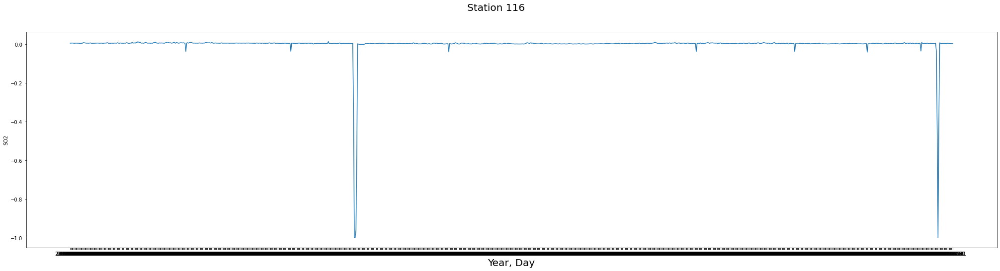

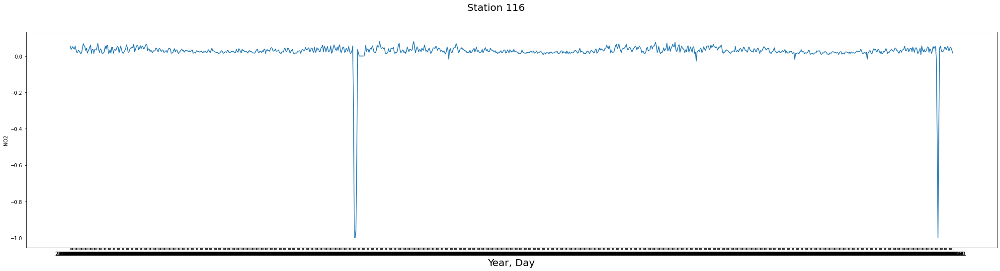

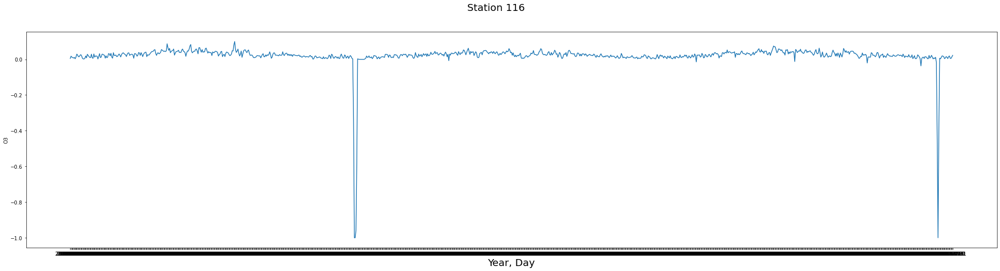

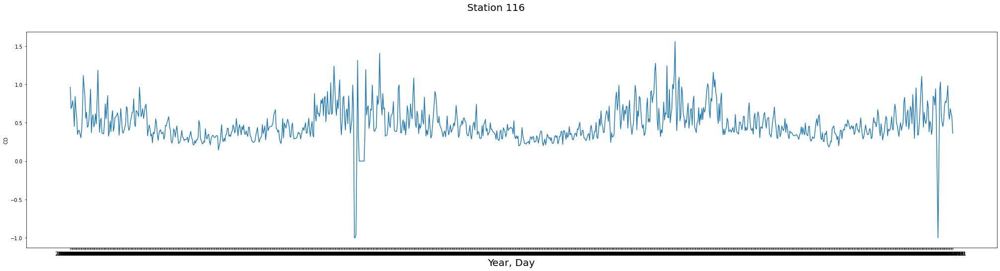

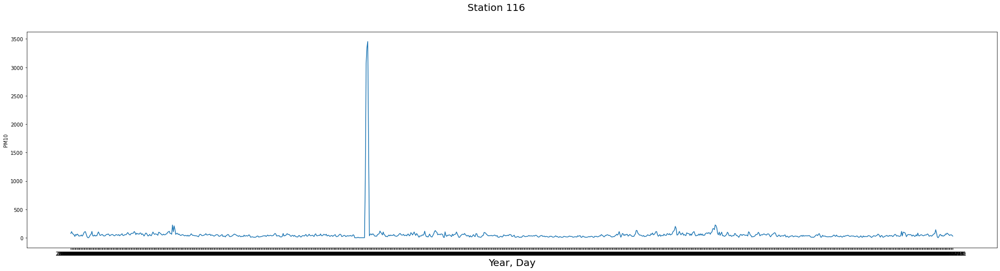

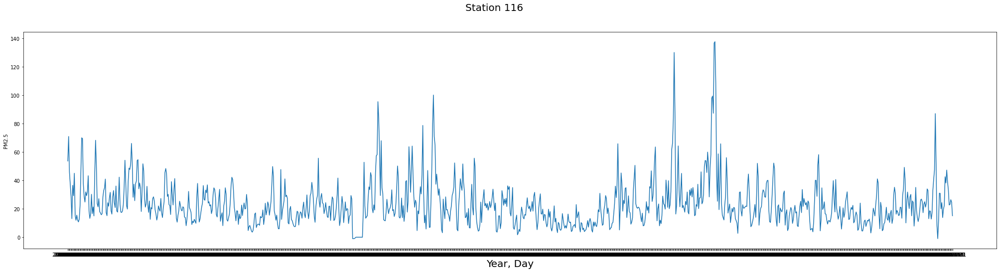

In [81]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 116", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_116)

# Station 117

In [82]:
df_117 = df[df['Station code'] == 117]

In [83]:
df_117.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
17360,117,2017-01-01,0.007000,0.036333,0.006208,0.983333,79.000000,54.375000,Good,Normal,Good,Good,Normal,Bad
17361,117,2017-01-02,0.008000,0.030458,0.016500,0.754167,116.416667,77.958333,Good,Normal,Good,Good,Bad,Very Bad
17362,117,2017-01-03,0.007417,0.030125,0.014958,0.637500,75.125000,48.750000,Good,Normal,Good,Good,Normal,Bad
17363,117,2017-01-04,0.007750,0.039250,0.009458,0.795833,60.166667,35.583333,Good,Normal,Good,Good,Normal,Bad
17364,117,2017-01-05,0.006000,0.029292,0.010417,0.554167,38.500000,21.583333,Good,Good,Good,Good,Normal,Normal


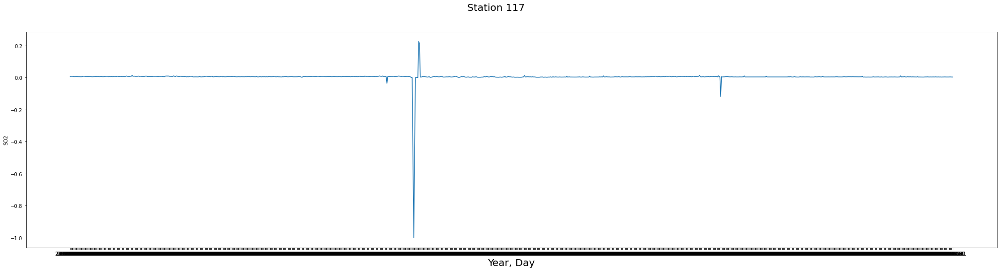

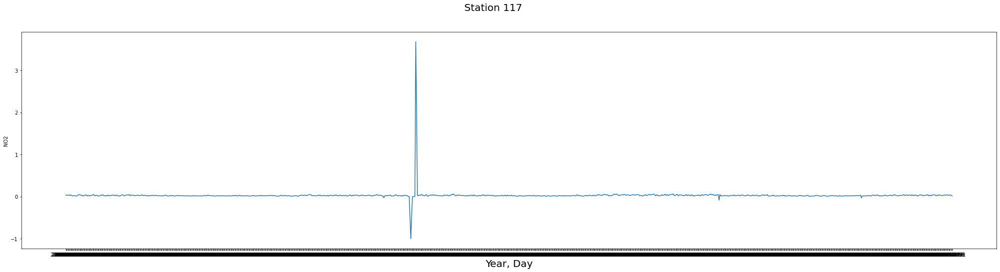

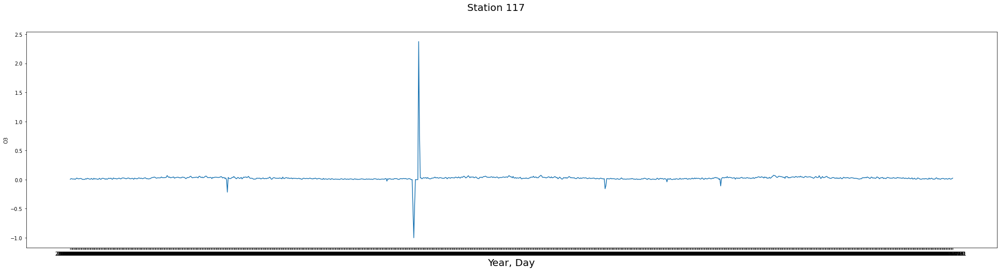

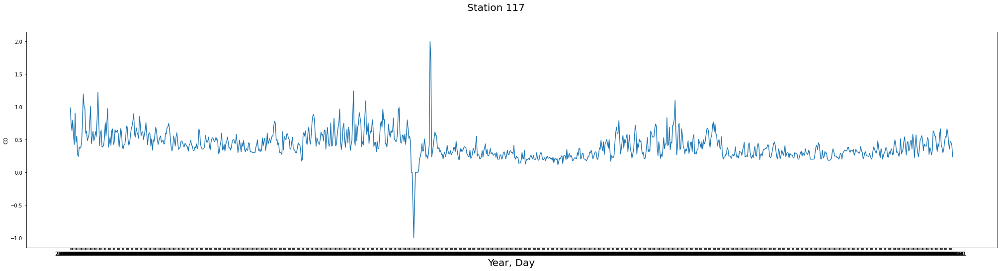

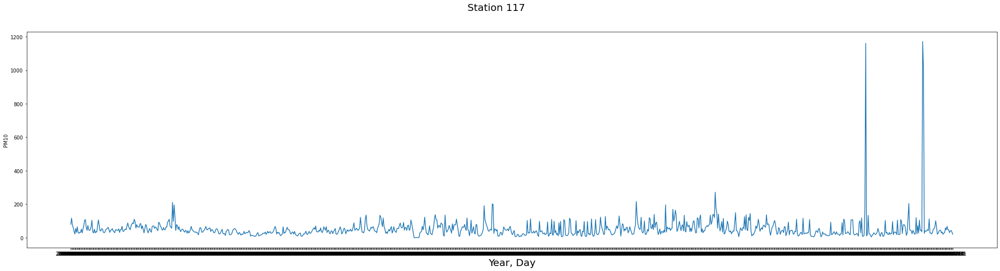

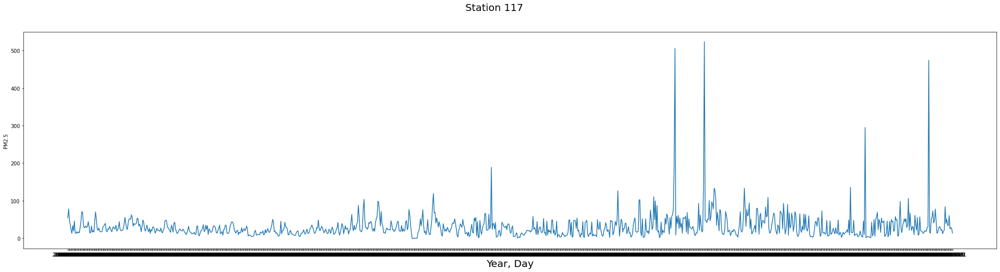

In [84]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 117", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_117)

# Station 118

In [85]:
df_118 = df[df['Station code'] == 118]

In [86]:
df_118.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
18445,118,2017-01-01,0.004875,0.053458,0.006083,1.029167,65.958333,45.000000,Good,Normal,Good,Good,Normal,Bad
18446,118,2017-01-02,0.005292,0.046000,0.015208,0.808333,100.666667,66.875000,Good,Normal,Good,Good,Bad,Bad
18447,118,2017-01-03,0.005000,0.043917,0.015625,0.675000,62.541667,37.958333,Good,Normal,Good,Good,Normal,Bad
18448,118,2017-01-04,0.004958,0.056167,0.008625,0.845833,52.416667,31.750000,Good,Normal,Good,Good,Normal,Normal
18449,118,2017-01-05,0.004000,0.040792,0.011375,0.679167,32.208333,18.916667,Good,Normal,Good,Good,Normal,Normal


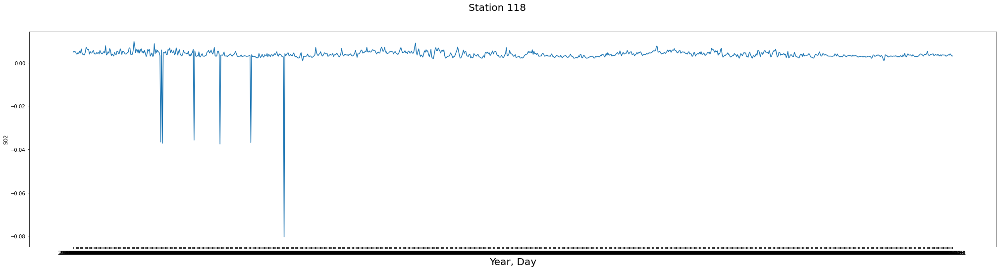

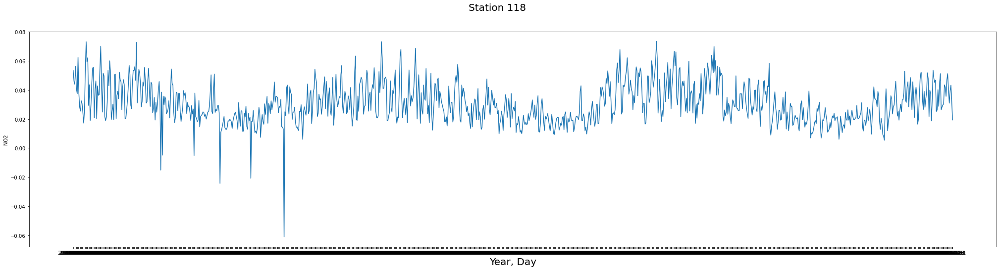

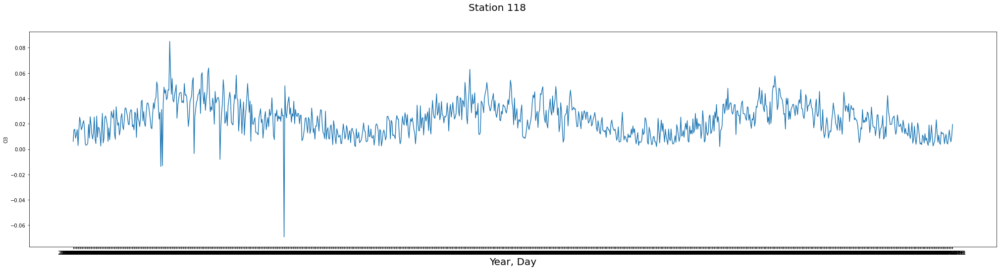

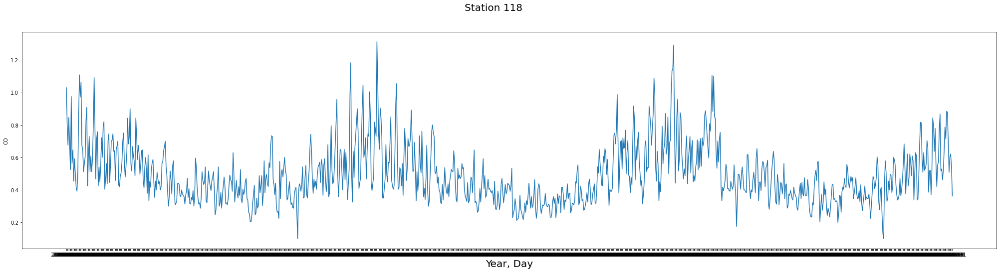

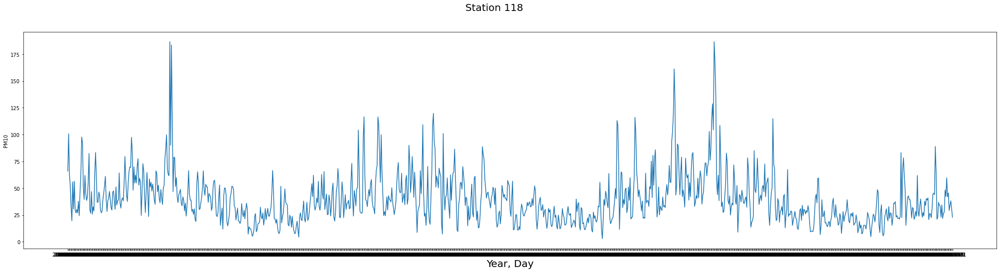

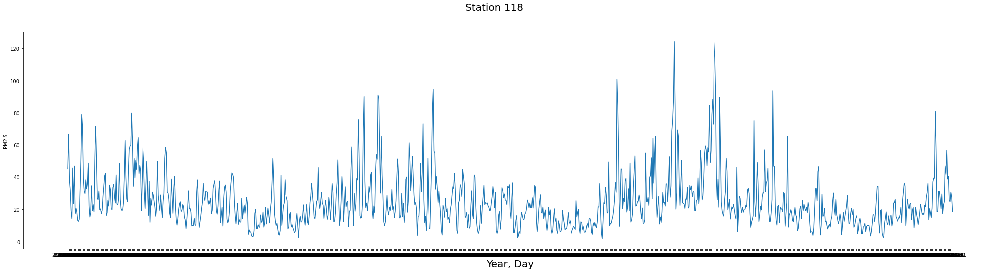

In [87]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 118", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_118)

# Station 119

In [88]:
df_119 = df[df['Station code'] == 119]

In [89]:
df_119.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
19530,119,2017-01-01,0.004458,0.030333,0.005708,1.179167,70.250000,52.583333,Good,Normal,Good,Good,Normal,Bad
19531,119,2017-01-02,0.004292,0.027042,0.013875,1.025000,107.333333,74.541667,Good,Good,Good,Good,Bad,Bad
19532,119,2017-01-03,-0.121292,-0.102583,-0.114958,0.583333,55.833333,36.416667,Good,Good,Good,Good,Normal,Bad
19533,119,2017-01-04,0.004375,0.033333,0.007958,1.008333,56.708333,33.500000,Good,Normal,Good,Good,Normal,Normal
19534,119,2017-01-05,0.004417,0.025292,0.010083,0.733333,36.750000,23.958333,Good,Good,Good,Good,Normal,Normal


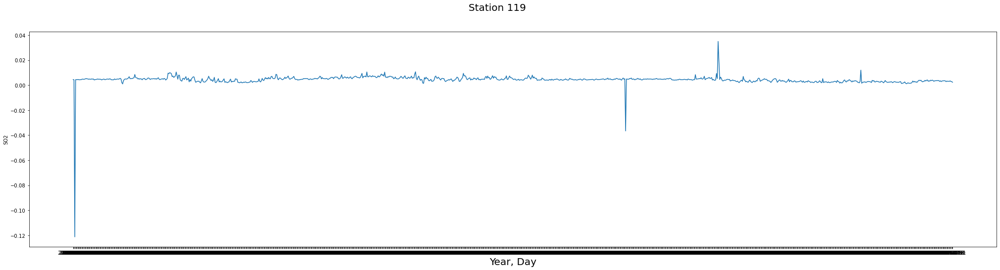

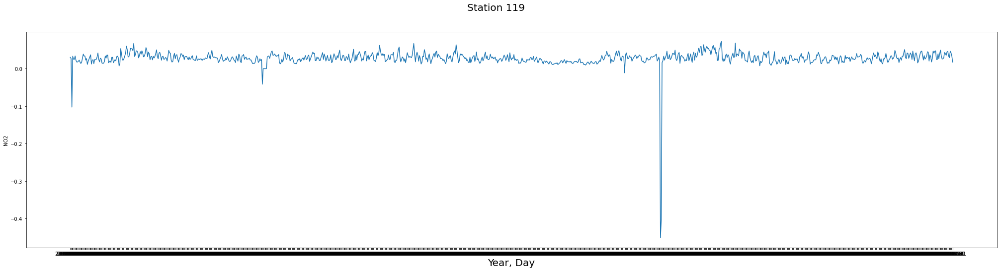

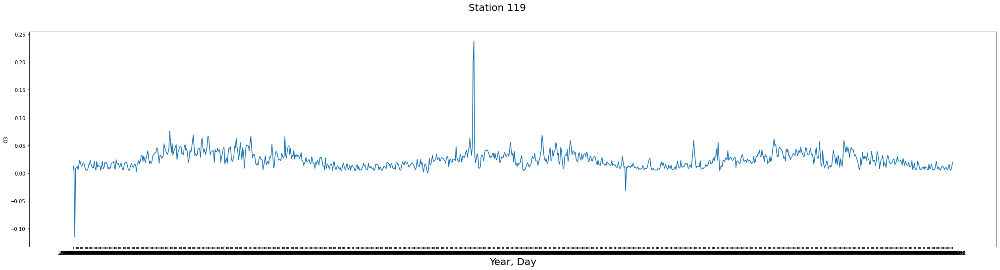

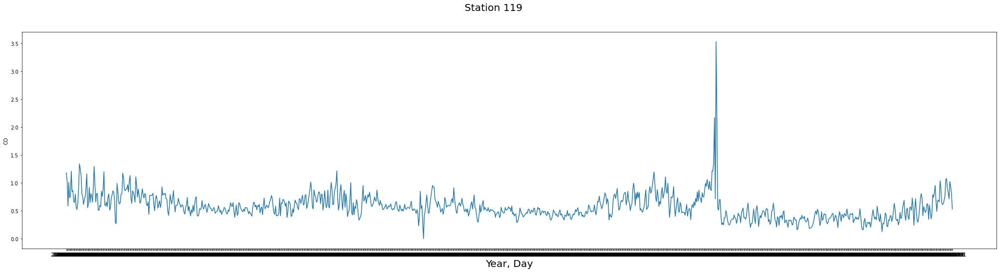

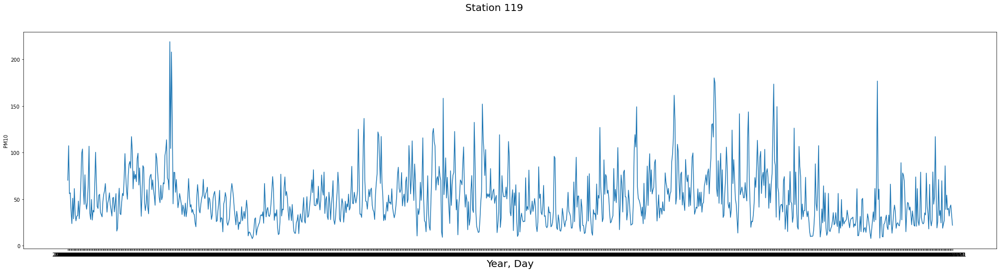

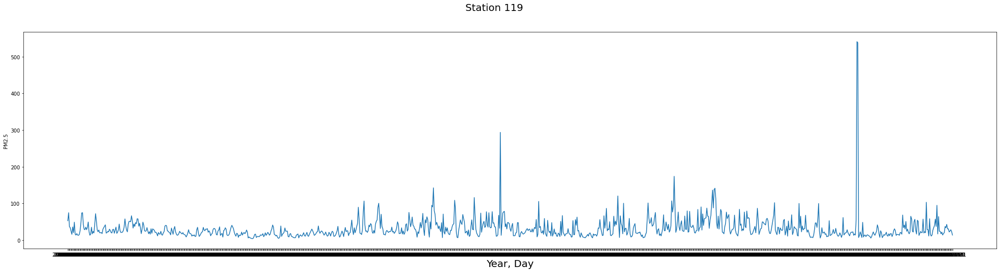

In [90]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 119", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_119)

# Station 120

In [91]:
df_120 = df[df['Station code'] == 120]

In [92]:
df_120.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
20615,120,2017-01-01,0.005417,0.058292,0.003583,1.104167,71.666667,57.666667,Good,Normal,Good,Good,Normal,Bad
20616,120,2017-01-02,0.009417,0.045167,0.018000,1.270833,99.791667,82.041667,Good,Normal,Good,Good,Bad,Very Bad
20617,120,2017-01-03,0.004708,0.041167,0.017417,0.729167,63.416667,45.500000,Good,Normal,Good,Good,Normal,Bad
20618,120,2017-01-04,0.005000,0.055958,0.008958,0.862500,52.250000,35.333333,Good,Normal,Good,Good,Normal,Bad
20619,120,2017-01-05,0.003833,0.045333,0.008750,0.720833,32.458333,23.958333,Good,Normal,Good,Good,Normal,Normal


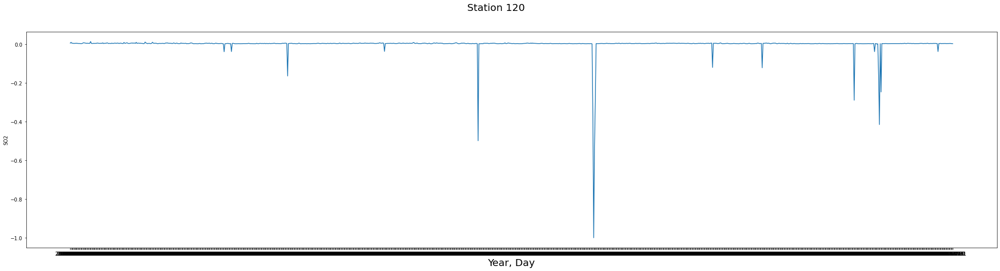

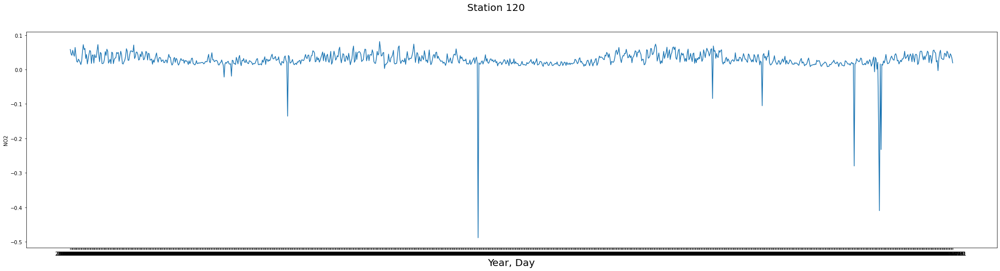

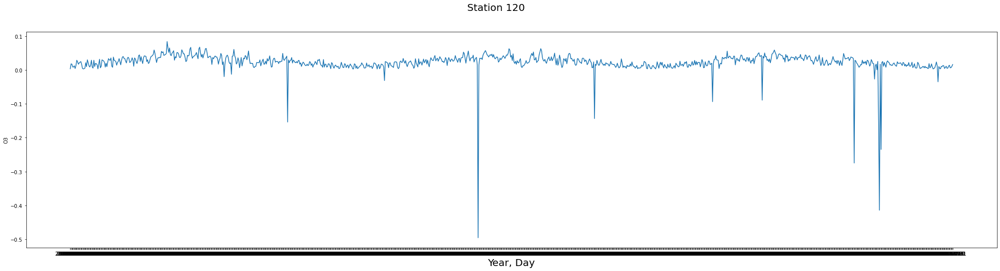

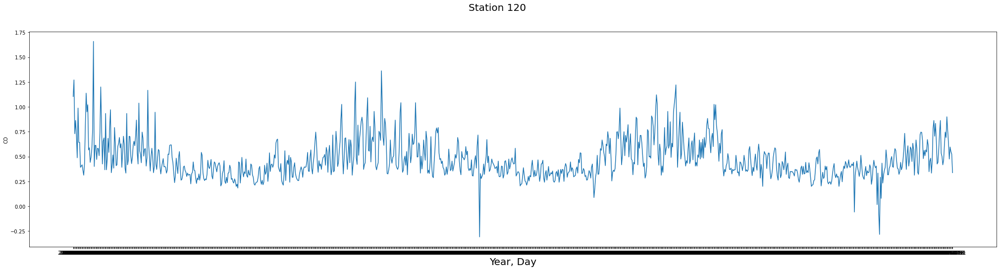

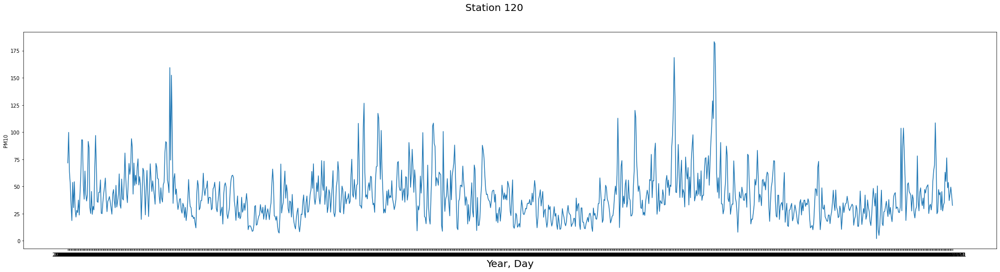

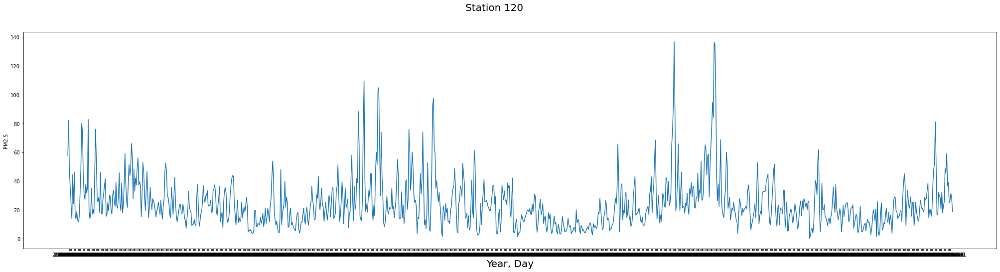

In [93]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 120", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_120)

# Station 121

In [94]:
df_121 = df[df['Station code'] == 121]

In [95]:
df_121.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
21700,121,2017-01-01,0.006375,0.064333,0.005375,1.258333,74.958333,55.750000,Good,Bad,Good,Good,Normal,Bad
21701,121,2017-01-02,0.007833,0.047792,0.016667,0.975000,95.375000,67.916667,Good,Normal,Good,Good,Bad,Bad
21702,121,2017-01-03,0.006917,0.048583,0.013875,0.816667,64.291667,42.083333,Good,Normal,Good,Good,Normal,Bad
21703,121,2017-01-04,0.006750,0.063958,0.008792,1.000000,54.666667,37.000000,Good,Bad,Good,Good,Normal,Bad
21704,121,2017-01-05,0.005542,0.049667,0.007667,0.695833,33.708333,24.541667,Good,Normal,Good,Good,Normal,Normal


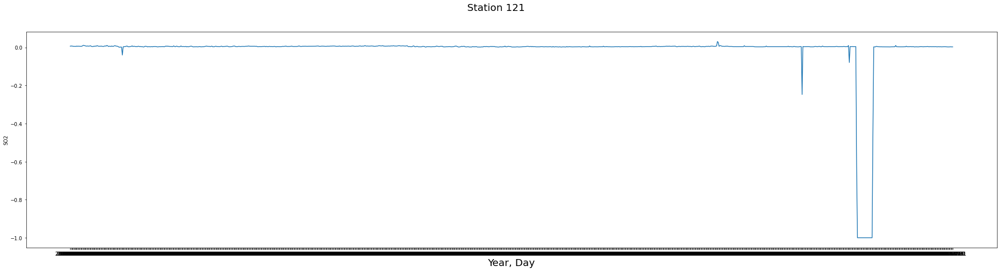

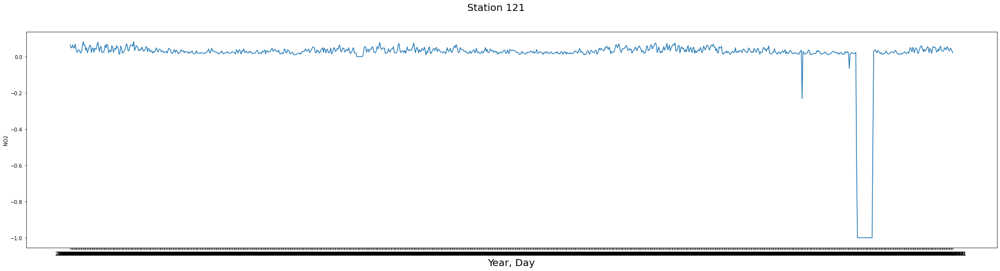

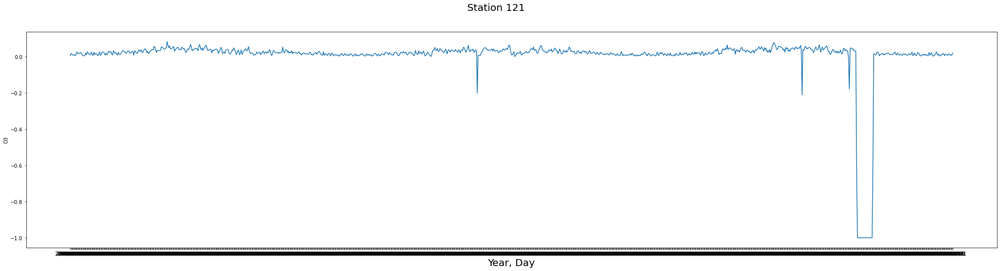

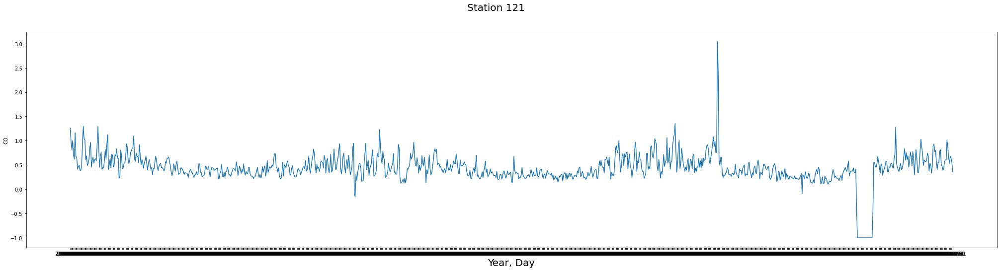

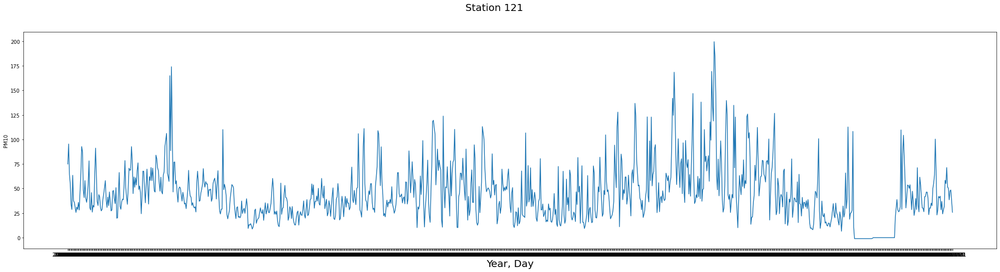

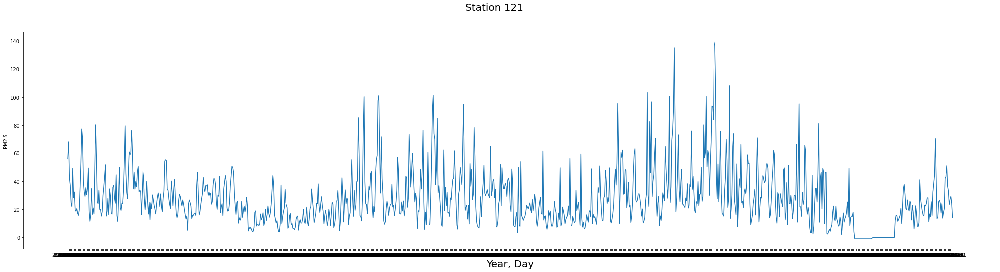

In [96]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 121", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_121)

# Station 122

In [97]:
df_122 = df[df['Station code'] == 122]

In [98]:
df_122.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
22785,122,2017-01-01,0.005292,0.041500,0.005000,1.195833,87.250000,51.208333,Good,Normal,Good,Good,Bad,Bad
22786,122,2017-01-02,0.006000,0.036917,0.021458,0.925000,122.958333,68.250000,Good,Normal,Good,Good,Bad,Bad
22787,122,2017-01-03,0.005667,0.039750,0.018000,0.725000,76.166667,39.166667,Good,Normal,Good,Good,Normal,Bad
22788,122,2017-01-04,0.005417,0.047500,0.011792,0.895833,55.708333,28.041667,Good,Normal,Good,Good,Normal,Normal
22789,122,2017-01-05,0.004917,0.038375,0.013292,0.795833,37.708333,17.625000,Good,Normal,Good,Good,Normal,Normal


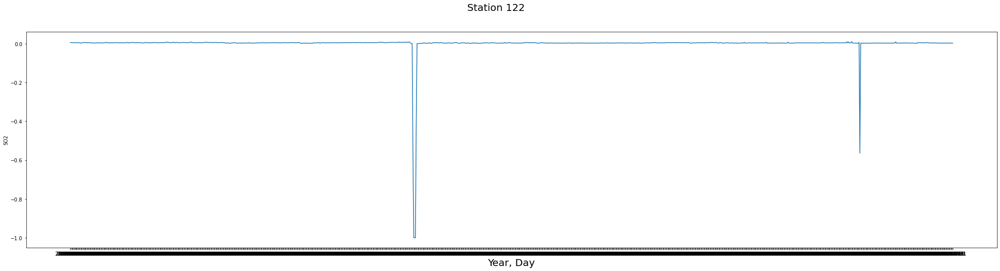

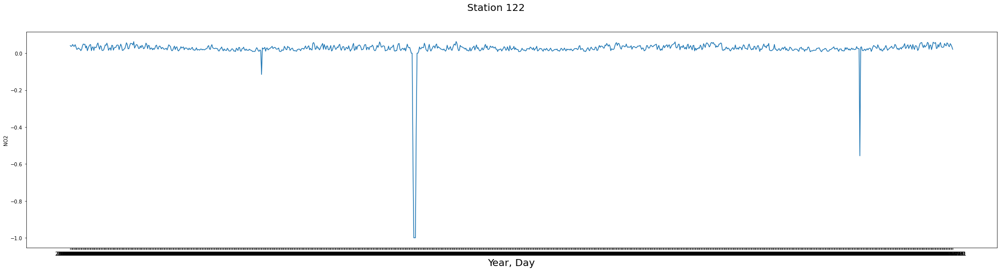

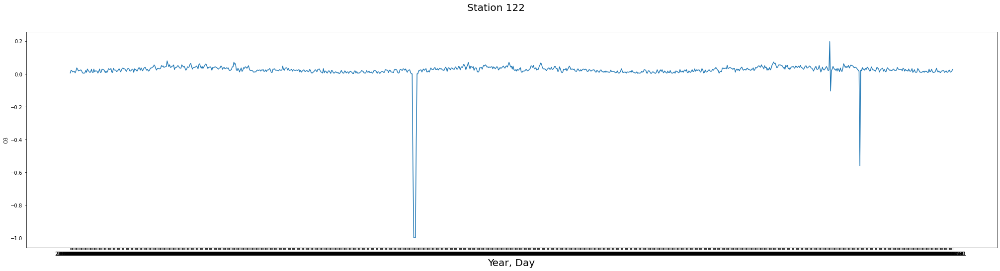

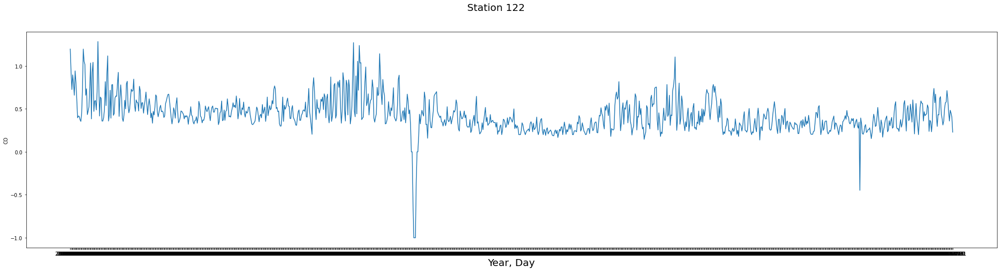

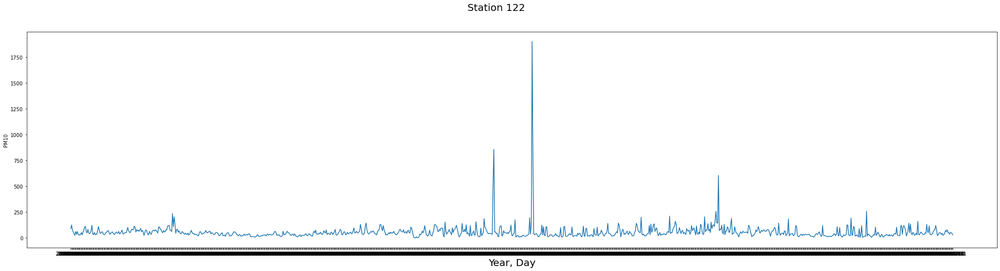

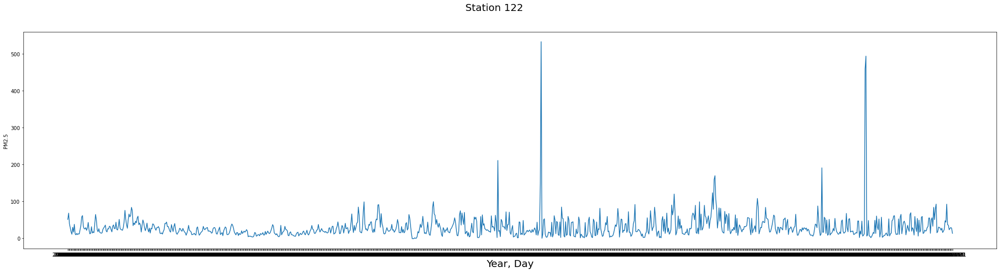

In [99]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 122", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_122)

# Station 123

In [100]:
df_123 = df[df['Station code'] == 123]

In [101]:
df_123.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
23870,123,2017-01-01,0.004792,0.039750,0.002375,0.775000,79.625000,57.791667,Good,Normal,Good,Good,Normal,Bad
23871,123,2017-01-02,0.005542,0.036000,0.014625,0.783333,118.416667,79.000000,Good,Normal,Good,Good,Bad,Very Bad
23872,123,2017-01-03,0.005625,0.036750,0.013542,0.641667,83.916667,50.041667,Good,Normal,Good,Good,Bad,Bad
23873,123,2017-01-04,0.005542,0.049667,0.006833,0.712500,57.875000,33.625000,Good,Normal,Good,Good,Normal,Normal
23874,123,2017-01-05,0.004667,0.038417,0.007542,0.512500,39.333333,20.541667,Good,Normal,Good,Good,Normal,Normal


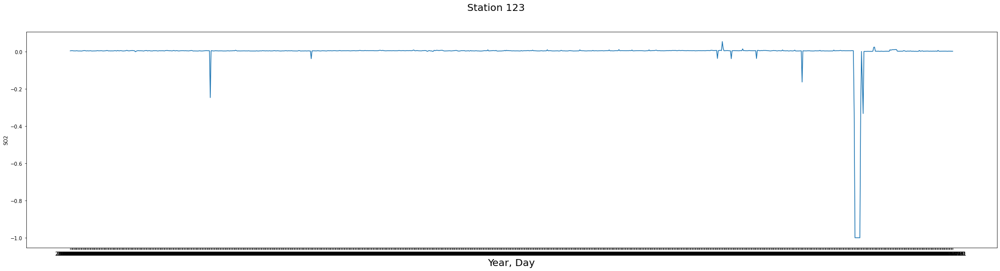

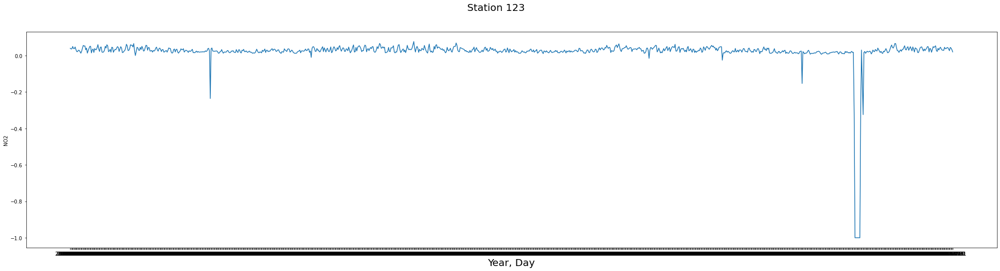

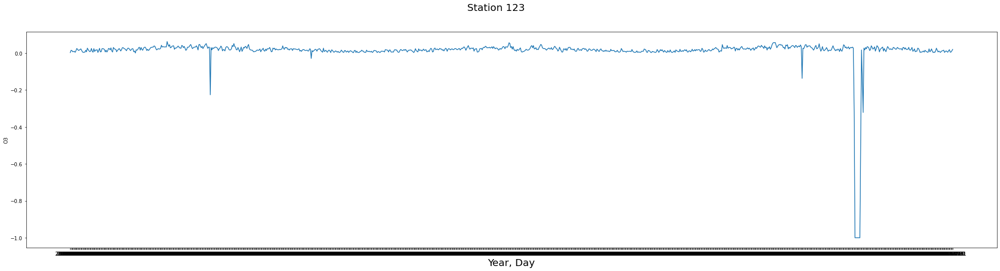

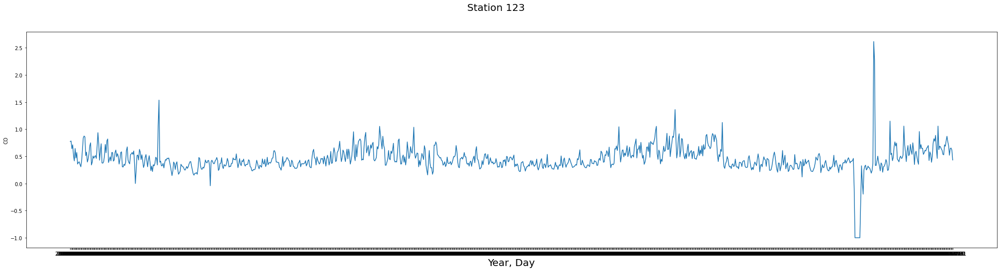

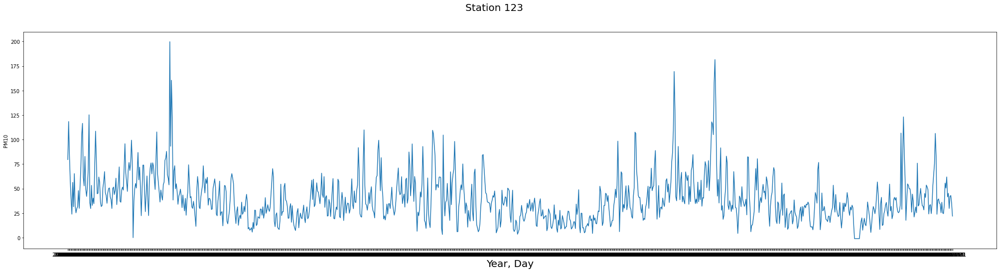

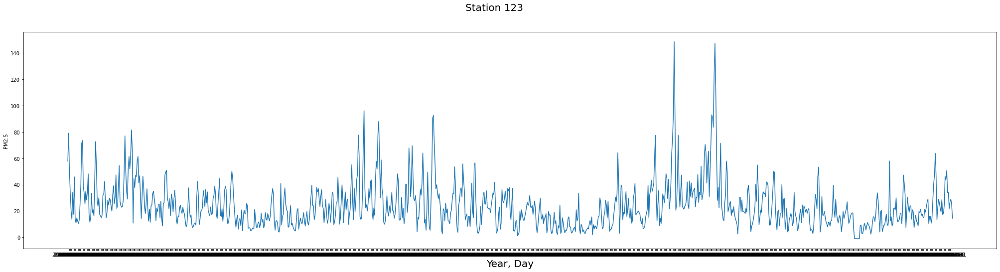

In [102]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 123", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_123)

# Station 124

In [103]:
df_124 = df[df['Station code'] == 124]

In [104]:
df_124.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
24955,124,2017-01-01,0.005333,0.039500,0.003750,1.162500,63.958333,48.791667,Good,Normal,Good,Good,Normal,Bad
24956,124,2017-01-02,0.005167,0.036375,0.018458,1.016667,92.416667,64.250000,Good,Normal,Good,Good,Bad,Bad
24957,124,2017-01-03,0.006083,0.038333,0.016583,0.866667,76.166667,47.041667,Good,Normal,Good,Good,Normal,Bad
24958,124,2017-01-04,0.006000,0.046958,0.008000,1.095833,54.583333,33.333333,Good,Normal,Good,Good,Normal,Normal
24959,124,2017-01-05,0.005625,0.032417,0.013542,0.783333,31.083333,19.375000,Good,Normal,Good,Good,Normal,Normal


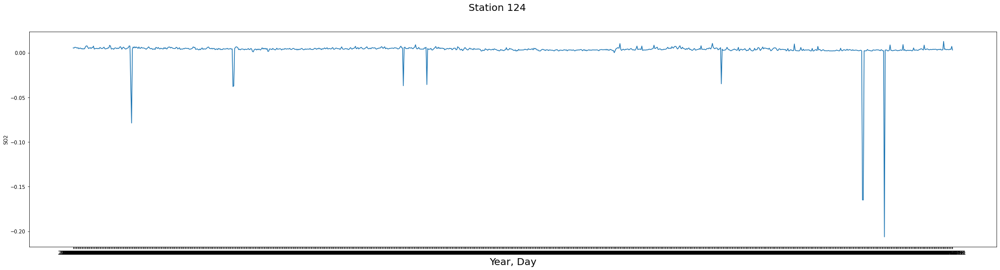

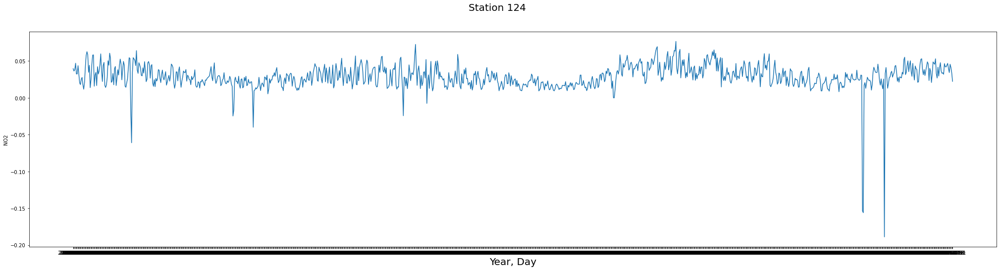

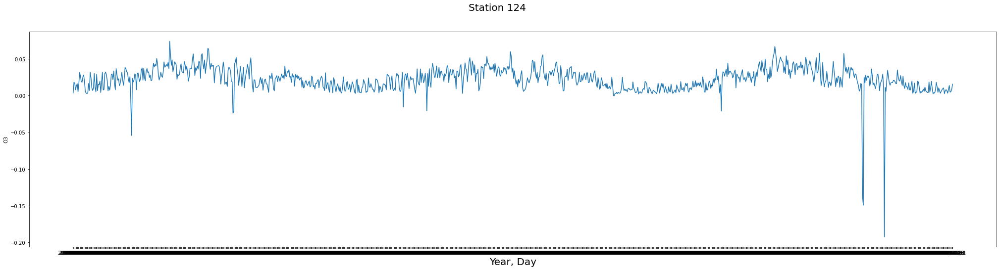

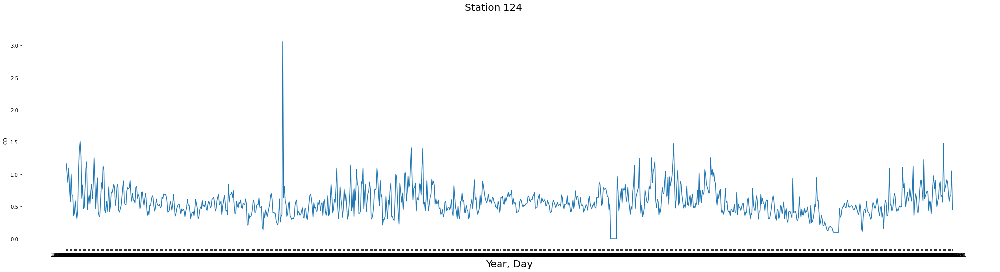

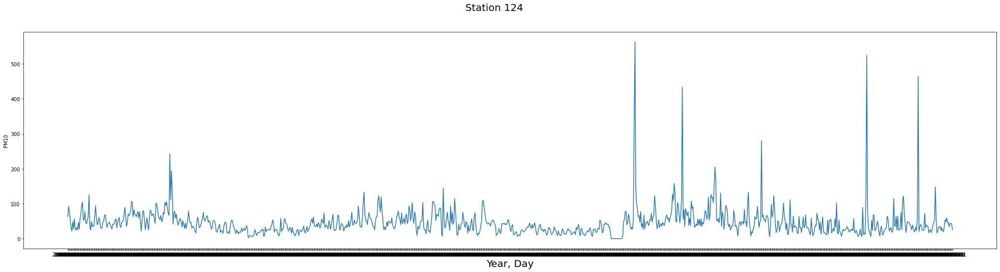

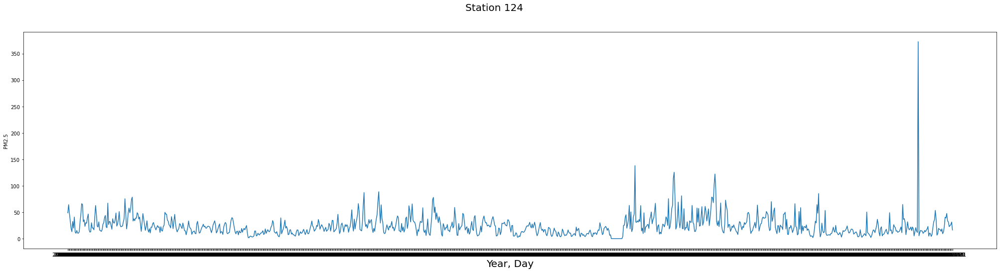

In [105]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 124", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_124)

# Station 125

In [106]:
df_125 = df[df['Station code'] == 125]

In [107]:
df_125.head()

,Station code,Measurement date,SO2,NO2,O3,CO,PM10,PM2.5,SO2 Level,NO2 Level,CO Level,O3 Level,PM10 Level,PM2.5 Level
26040,125,2017-01-01,0.003833,0.039042,0.003375,0.825000,79.583333,54.208333,Good,Normal,Good,Good,Normal,Bad
26041,125,2017-01-02,-0.037167,-0.003250,-0.028083,0.845833,115.583333,80.083333,Good,Good,Good,Good,Bad,Very Bad
26042,125,2017-01-03,0.004917,0.045333,0.011458,0.891667,105.958333,68.708333,Good,Normal,Good,Good,Bad,Bad
26043,125,2017-01-04,0.005000,0.055000,0.005208,0.958333,66.083333,39.666667,Good,Normal,Good,Good,Normal,Bad
26044,125,2017-01-05,0.004042,0.031708,0.013750,0.587500,35.541667,21.500000,Good,Normal,Good,Good,Normal,Normal


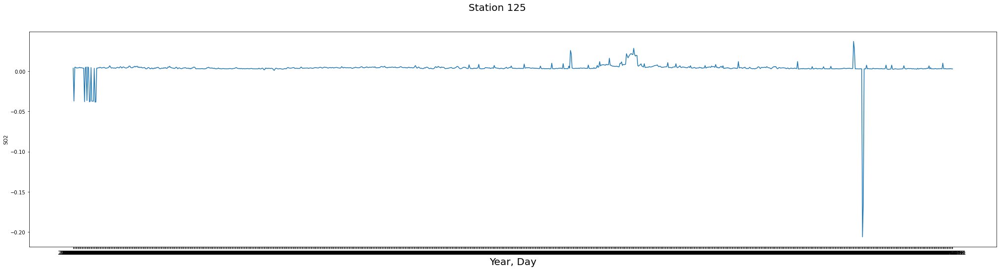

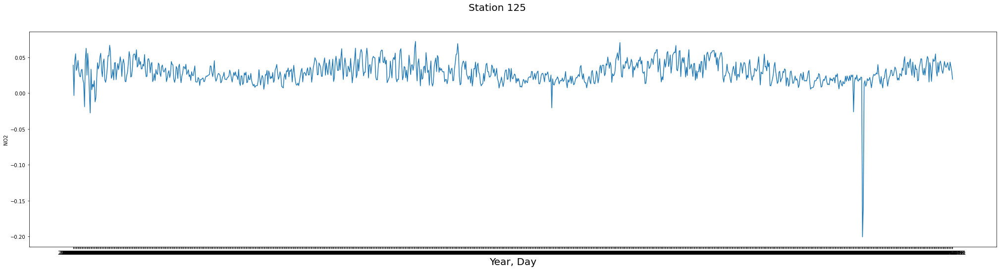

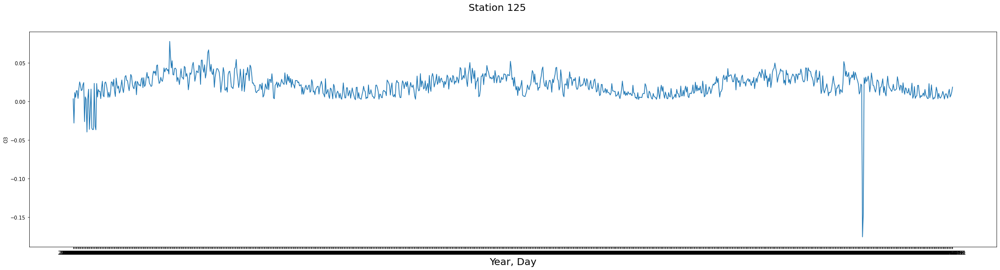

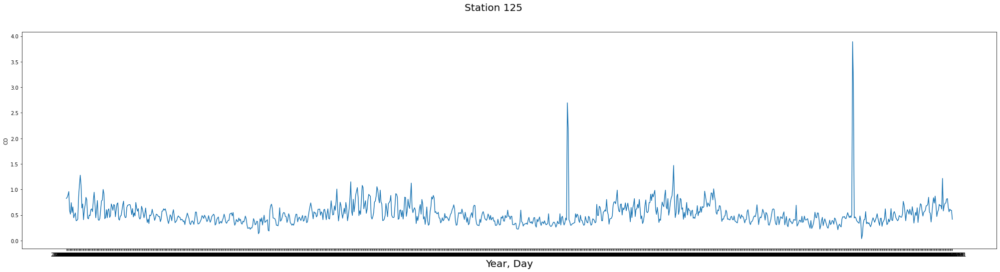

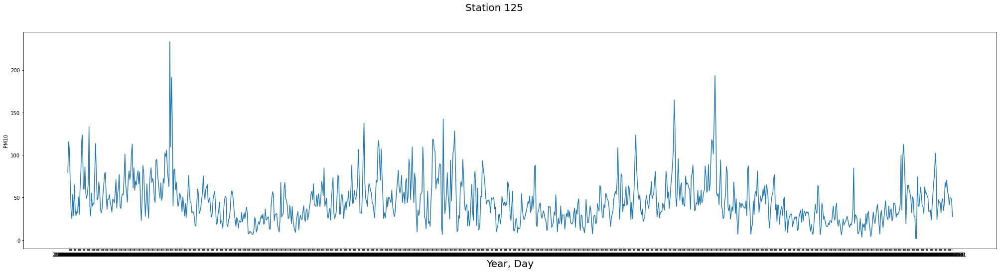

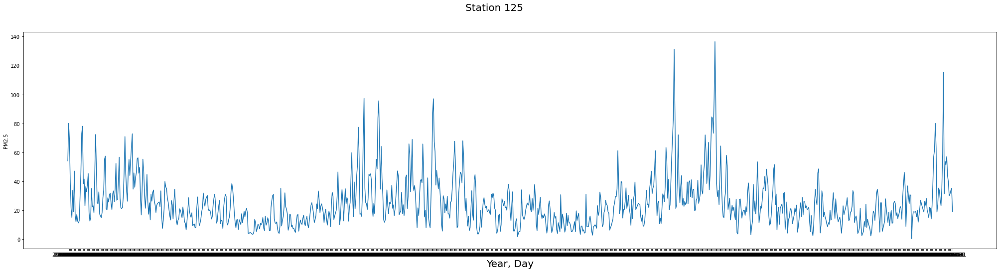

In [108]:
for feature in features:
    fig, ax = plt.subplots(figsize=(35,8))
    fig.suptitle("Station 125", fontsize=20)
    ax.set_xlabel('Year, Day', fontsize=20)
    sns.lineplot(x='Measurement date', y=feature, data=df_125)